<a href="https://colab.research.google.com/github/akshat-chore/super-point-detection/blob/main/SuperPoint_Self_Supervised_Interest_Point_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Check GPU availability
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Install required packages
!pip install opencv-python opencv-contrib-python
!pip install matplotlib numpy scipy
!pip install tensorboard

# Check installations
import cv2
import numpy as np
import matplotlib.pyplot as plt
print("\n✅ All packages installed successfully!")

PyTorch version: 2.8.0+cu126
CUDA available: True
GPU: Tesla T4

✅ All packages installed successfully!


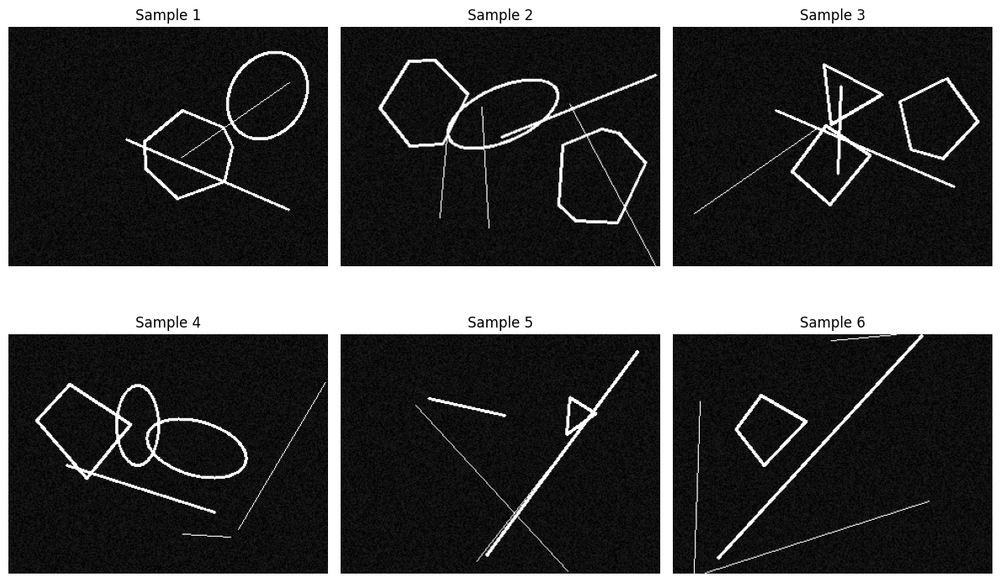

✅ Synthetic dataset generator created successfully!


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from typing import Tuple

class SyntheticShapes:
    """Generate synthetic images with geometric shapes for MagicPoint training"""

    def __init__(self, image_size: Tuple[int, int] = (240, 320)):
        self.image_size = image_size

    def generate_background(self) -> np.ndarray:
        """Generate random background with noise"""
        img = np.zeros(self.image_size, dtype=np.uint8)
        # Add some noise
        noise = np.random.randint(0, 30, self.image_size, dtype=np.uint8)
        img = cv2.add(img, noise)
        return img

    def draw_line(self, img: np.ndarray) -> np.ndarray:
        """Draw random lines"""
        num_lines = np.random.randint(1, 4)
        for _ in range(num_lines):
            pt1 = (np.random.randint(0, self.image_size[1]),
                   np.random.randint(0, self.image_size[0]))
            pt2 = (np.random.randint(0, self.image_size[1]),
                   np.random.randint(0, self.image_size[0]))
            thickness = np.random.randint(1, 3)
            cv2.line(img, pt1, pt2, 255, thickness)
        return img

    def draw_polygon(self, img: np.ndarray) -> np.ndarray:
        """Draw random polygons (triangles, rectangles, etc.)"""
        num_sides = np.random.randint(3, 8)
        center = (np.random.randint(50, self.image_size[1]-50),
                 np.random.randint(50, self.image_size[0]-50))
        radius = np.random.randint(20, 60)

        points = []
        for i in range(num_sides):
            angle = 2 * np.pi * i / num_sides + np.random.uniform(-0.3, 0.3)
            x = int(center[0] + radius * np.cos(angle))
            y = int(center[1] + radius * np.sin(angle))
            points.append([x, y])

        points = np.array(points, dtype=np.int32)
        cv2.polylines(img, [points], True, 255, 2)
        return img

    def draw_ellipse(self, img: np.ndarray) -> np.ndarray:
        """Draw random ellipses/circles"""
        center = (np.random.randint(50, self.image_size[1]-50),
                 np.random.randint(50, self.image_size[0]-50))
        axes = (np.random.randint(20, 60), np.random.randint(20, 60))
        angle = np.random.randint(0, 180)
        cv2.ellipse(img, center, axes, angle, 0, 360, 255, 2)
        return img

    def generate_sample(self) -> np.ndarray:
        """Generate one synthetic image with random shapes"""
        img = self.generate_background()

        # Randomly add different shapes
        num_shapes = np.random.randint(2, 6)
        for _ in range(num_shapes):
            shape_type = np.random.choice(['line', 'polygon', 'ellipse'])
            if shape_type == 'line':
                img = self.draw_line(img)
            elif shape_type == 'polygon':
                img = self.draw_polygon(img)
            else:
                img = self.draw_ellipse(img)

        return img

# Test the generator
generator = SyntheticShapes()

# Generate and visualize 6 samples
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for i, ax in enumerate(axes.flat):
    sample = generator.generate_sample()
    ax.imshow(sample, cmap='gray')
    ax.set_title(f'Sample {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()
print("✅ Synthetic dataset generator created successfully!")

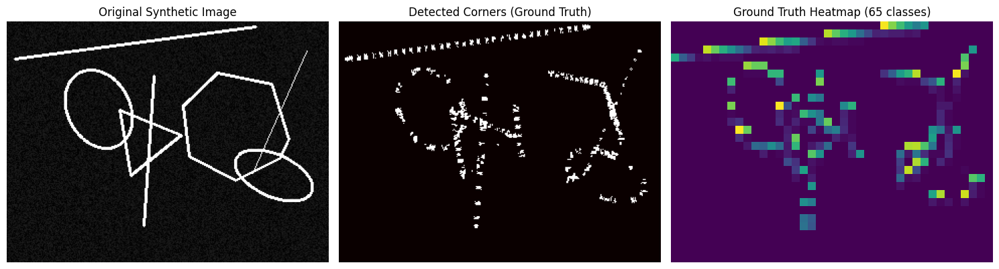

✅ Ground truth extractor created!
Heatmap shape: (30, 40)
Number of interest points: 221
Unique classes in heatmap: 57


In [ ]:
def extract_interest_points(img: np.ndarray, cell_size: int = 8) -> np.ndarray:
    """
    Extract interest points (corners) from synthetic images.
    Returns a heatmap where each 8x8 cell has a class label (0-64).
    """
    H, W = img.shape
    H_c, W_c = H // cell_size, W // cell_size

    # Use Harris corner detector to find interest points
    corners = cv2.cornerHarris(img, blockSize=3, ksize=3, k=0.04)

    # Threshold to get binary corner map
    corner_threshold = 0.01 * corners.max()
    corner_mask = (corners > corner_threshold).astype(np.uint8)

    # Create ground truth heatmap (H/8 x W/8)
    # Each location can be 0-64: 0 = no interest, 1-64 = position in 8x8 cell
    gt_heatmap = np.zeros((H_c, W_c), dtype=np.int64)

    # Find corner coordinates
    corner_coords = np.argwhere(corner_mask > 0)

    for y, x in corner_coords:
        # Which cell does this corner belong to?
        cell_y, cell_x = y // cell_size, x // cell_size

        # Position within the 8x8 cell
        local_y, local_x = y % cell_size, x % cell_size

        # Convert to class label (1-64)
        class_label = local_y * cell_size + local_x + 1

        if cell_y < H_c and cell_x < W_c:
            # Only keep the strongest corner per cell
            if gt_heatmap[cell_y, cell_x] == 0:
                gt_heatmap[cell_y, cell_x] = class_label

    return gt_heatmap, corner_mask

# Test the interest point extraction
test_img = generator.generate_sample()

gt_heatmap, corner_mask = extract_interest_points(test_img)

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(test_img, cmap='gray')
axes[0].set_title('Original Synthetic Image')
axes[0].axis('off')

axes[1].imshow(corner_mask, cmap='hot')
axes[1].set_title('Detected Corners (Ground Truth)')
axes[1].axis('off')

axes[2].imshow(gt_heatmap, cmap='viridis')
axes[2].set_title('Ground Truth Heatmap (65 classes)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"✅ Ground truth extractor created!")
print(f"Heatmap shape: {gt_heatmap.shape}")
print(f"Number of interest points: {np.sum(gt_heatmap > 0)}")
print(f"Unique classes in heatmap: {len(np.unique(gt_heatmap))}")

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SuperPointNet(nn.Module):
    """SuperPoint Network Architecture"""

    def __init__(self):
        super(SuperPointNet, self).__init__()

        # Shared Encoder (VGG-style)
        self.conv1a = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1)
        self.conv1b = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)

        self.conv2a = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.conv2b = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)

        self.conv3a = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3b = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)

        self.conv4a = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        self.conv4b = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)

        # Detector Head (predicts interest points)
        self.convPa = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.convPb = nn.Conv2d(256, 65, kernel_size=1, stride=1, padding=0)  # 65 classes

        # Descriptor Head (generates feature descriptors)
        self.convDa = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.convDb = nn.Conv2d(256, 256, kernel_size=1, stride=1, padding=0)  # 256-dim descriptors

    def forward(self, x):
        """Forward pass through the network"""

        # Shared Encoder
        x = F.relu(self.conv1a(x))
        x = F.relu(self.conv1b(x))
        x = F.max_pool2d(x, kernel_size=2, stride=2)  # /2

        x = F.relu(self.conv2a(x))
        x = F.relu(self.conv2b(x))
        x = F.max_pool2d(x, kernel_size=2, stride=2)  # /4

        x = F.relu(self.conv3a(x))
        x = F.relu(self.conv3b(x))
        x = F.max_pool2d(x, kernel_size=2, stride=2)  # /8

        x = F.relu(self.conv4a(x))
        x = F.relu(self.conv4b(x))

        # Detector Head
        cPa = F.relu(self.convPa(x))
        semi = self.convPb(cPa)  # [B, 65, H/8, W/8]

        # Descriptor Head
        cDa = F.relu(self.convDa(x))
        desc = self.convDb(cDa)  # [B, 256, H/8, W/8]

        # Normalize descriptors
        desc = F.normalize(desc, p=2, dim=1)

        return semi, desc

# Create model and test
model = SuperPointNet()

# Move to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Test with dummy input
dummy_input = torch.randn(2, 1, 240, 320).to(device)  # Batch of 2 images
semi_output, desc_output = model(dummy_input)

print("✅ SuperPoint Network created successfully!")
print(f"Model device: {device}")
print(f"Input shape: {dummy_input.shape}")
print(f"Detector output shape: {semi_output.shape}")
print(f"Descriptor output shape: {desc_output.shape}")
print(f"\nTotal parameters: {sum(p.numel() for p in model.parameters()):,}")

✅ SuperPoint Network created successfully!
Model device: cuda
Input shape: torch.Size([2, 1, 240, 320])
Detector output shape: torch.Size([2, 65, 30, 40])
Descriptor output shape: torch.Size([2, 256, 30, 40])

Total parameters: 1,300,865


✅ Dataset created successfully!
Training samples: 5000
Validation samples: 500
Sample image shape: torch.Size([1, 240, 320])
Sample GT shape: torch.Size([30, 40])
Image value range: [0.00, 1.00]

Batch shapes:
Images: torch.Size([8, 1, 240, 320])
Ground truth: torch.Size([8, 30, 40])


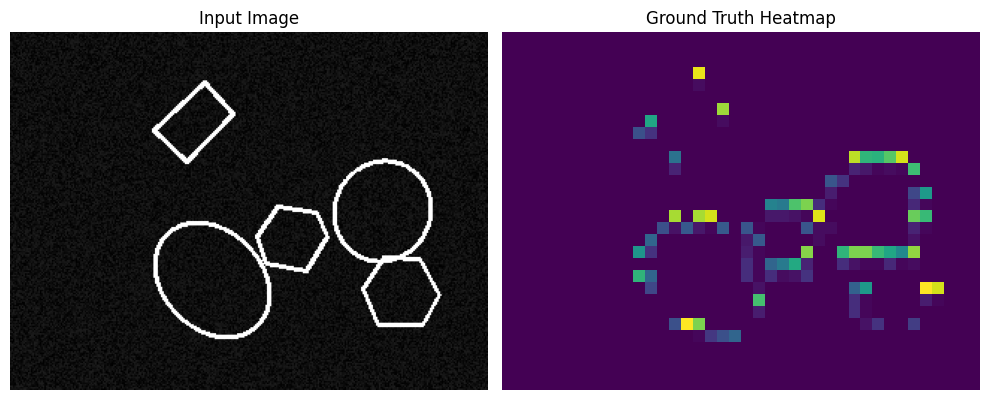

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class SyntheticDataset(Dataset):
    """PyTorch Dataset for synthetic shapes"""

    def __init__(self, num_samples=5000, image_size=(240, 320)):
        self.num_samples = num_samples
        self.image_size = image_size
        self.generator = SyntheticShapes(image_size)

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        # Generate synthetic image
        img = self.generator.generate_sample()

        # Extract ground truth interest points
        gt_heatmap, _ = extract_interest_points(img, cell_size=8)

        # Convert to tensors
        img_tensor = torch.from_numpy(img).float().unsqueeze(0) / 255.0  # [1, H, W]
        gt_tensor = torch.from_numpy(gt_heatmap).long()  # [H/8, W/8]

        return img_tensor, gt_tensor

# Create datasets
train_dataset = SyntheticDataset(num_samples=5000)
val_dataset = SyntheticDataset(num_samples=500)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)

# Test the dataset
sample_img, sample_gt = train_dataset[0]

print("✅ Dataset created successfully!")
print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Sample image shape: {sample_img.shape}")
print(f"Sample GT shape: {sample_gt.shape}")
print(f"Image value range: [{sample_img.min():.2f}, {sample_img.max():.2f}]")

# Visualize a batch
batch_imgs, batch_gts = next(iter(train_loader))
print(f"\nBatch shapes:")
print(f"Images: {batch_imgs.shape}")
print(f"Ground truth: {batch_gts.shape}")

# Visualize one sample from batch
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(batch_imgs[0, 0].cpu().numpy(), cmap='gray')
axes[0].set_title('Input Image')
axes[0].axis('off')

axes[1].imshow(batch_gts[0].cpu().numpy(), cmap='viridis')
axes[1].set_title('Ground Truth Heatmap')
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
class SuperPointLoss(nn.Module):
    """Loss function for SuperPoint training"""

    def __init__(self):
        super(SuperPointLoss, self).__init__()
        self.cross_entropy = nn.CrossEntropyLoss()

    def detector_loss(self, semi, labels):
        """
        Compute loss for interest point detector
        semi: [B, 65, H/8, W/8] - predicted logits
        labels: [B, H/8, W/8] - ground truth class labels (0-64)
        """
        loss = self.cross_entropy(semi, labels)
        return loss

    def forward(self, semi, desc, labels):
        """
        For now, we only compute detector loss (MagicPoint phase)
        Descriptor loss will be added later for full SuperPoint training
        """
        det_loss = self.detector_loss(semi, labels)
        return det_loss

# Create loss function
criterion = SuperPointLoss()

# Test the loss
model.eval()
with torch.no_grad():
    test_imgs, test_labels = next(iter(train_loader))
    test_imgs = test_imgs.to(device)
    test_labels = test_labels.to(device)

    semi_pred, desc_pred = model(test_imgs)
    loss = criterion(semi_pred, desc_pred, test_labels)

print("✅ Loss function created successfully!")
print(f"Test loss value: {loss.item():.4f}")
print(f"Prediction shape: {semi_pred.shape}")
print(f"Labels shape: {test_labels.shape}")

✅ Loss function created successfully!
Test loss value: 4.1559
Prediction shape: torch.Size([8, 65, 30, 40])
Labels shape: torch.Size([8, 30, 40])


In [ ]:
import torch
from google.colab import drive

# Mount Google Drive (if not already mounted)
drive.mount('/content/drive')

# Define the path to the saved model in your Google Drive
drive_path = '/content/drive/MyDrive/superpoint_synthetic.pth'

# Assuming 'model' is already defined (the SuperPointNet architecture)
# Make sure you define or load the model architecture first before loading state_dict



# Load the saved state dictionary
try:
    model.load_state_dict(torch.load(drive_path))
    print(f"Model loaded successfully from {drive_path}")
except FileNotFoundError:
    print(f"Error: Model file not found at {drive_path}")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")

# Move the model to the appropriate device (CPU or GPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(f"Model is now on device: {device}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model loaded successfully from /content/drive/MyDrive/superpoint_synthetic.pth
Model is now on device: cuda


In [ ]:
from tqdm import tqdm
import time

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    total_loss = 0

    pbar = tqdm(train_loader, desc='Training')
    for imgs, labels in pbar:
        imgs = imgs.to(device)
        labels = labels.to(device)

        # Forward pass
        semi, desc = model(imgs)
        loss = criterion(semi, desc, labels)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    return total_loss / len(train_loader)

def validate(model, val_loader, criterion, device):
    """Validate the model"""
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            semi, desc = model(imgs)
            loss = criterion(semi, desc, labels)

            total_loss += loss.item()

    return total_loss / len(val_loader)

def train_magicpoint(model, train_loader, val_loader, criterion, num_epochs=10, lr=0.001):
    """Complete training function for MagicPoint"""

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_losses = []
    val_losses = []

    print(f"🚀 Starting MagicPoint training for {num_epochs} epochs...")
    print(f"Device: {device}")
    print(f"Learning rate: {lr}")
    print("-" * 60)

    for epoch in range(num_epochs):
        start_time = time.time()

        # Train
        train_loss = train_epoch(model, train_loader, criterion, optimizer, device)

        # Validate
        val_loss = validate(model, val_loader, criterion, device)

        # Record losses
        train_losses.append(train_loss)
        val_losses.append(val_loss)

        epoch_time = time.time() - start_time

        print(f"Epoch {epoch+1}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f} | "
              f"Val Loss: {val_loss:.4f} | "
              f"Time: {epoch_time:.2f}s")

    print("-" * 60)
    print("✅ Training complete!")

    return train_losses, val_losses

# Setup is ready - don't train yet!
print("✅ Training loop created successfully!")
print("\nReady to train! This will take a few minutes.")
print("The model will train for 10 epochs on synthetic shapes.")

✅ Training loop created successfully!

Ready to train! This will take a few minutes.
The model will train for 10 epochs on synthetic shapes.


🚀 Starting MagicPoint training for 10 epochs...
Device: cuda
Learning rate: 0.001
------------------------------------------------------------


Training: 100%|██████████| 625/625 [00:54<00:00, 11.46it/s, loss=0.2643]


Epoch 1/10 | Train Loss: 0.4108 | Val Loss: 0.2696 | Time: 57.75s


Training: 100%|██████████| 625/625 [00:56<00:00, 11.00it/s, loss=0.2391]


Epoch 2/10 | Train Loss: 0.2527 | Val Loss: 0.2361 | Time: 59.33s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.86it/s, loss=0.2269]


Epoch 3/10 | Train Loss: 0.2250 | Val Loss: 0.2081 | Time: 60.93s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.88it/s, loss=0.1823]


Epoch 4/10 | Train Loss: 0.2039 | Val Loss: 0.1922 | Time: 59.87s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.87it/s, loss=0.1665]


Epoch 5/10 | Train Loss: 0.1880 | Val Loss: 0.1825 | Time: 59.89s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.88it/s, loss=0.1437]


Epoch 6/10 | Train Loss: 0.1746 | Val Loss: 0.1640 | Time: 59.84s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.93it/s, loss=0.1723]


Epoch 7/10 | Train Loss: 0.1632 | Val Loss: 0.1553 | Time: 60.27s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.92it/s, loss=0.1774]


Epoch 8/10 | Train Loss: 0.1556 | Val Loss: 0.1468 | Time: 59.78s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.86it/s, loss=0.1739]


Epoch 9/10 | Train Loss: 0.1483 | Val Loss: 0.1418 | Time: 60.03s


Training: 100%|██████████| 625/625 [00:57<00:00, 10.92it/s, loss=0.1282]


Epoch 10/10 | Train Loss: 0.1423 | Val Loss: 0.1423 | Time: 59.72s
------------------------------------------------------------
✅ Training complete!


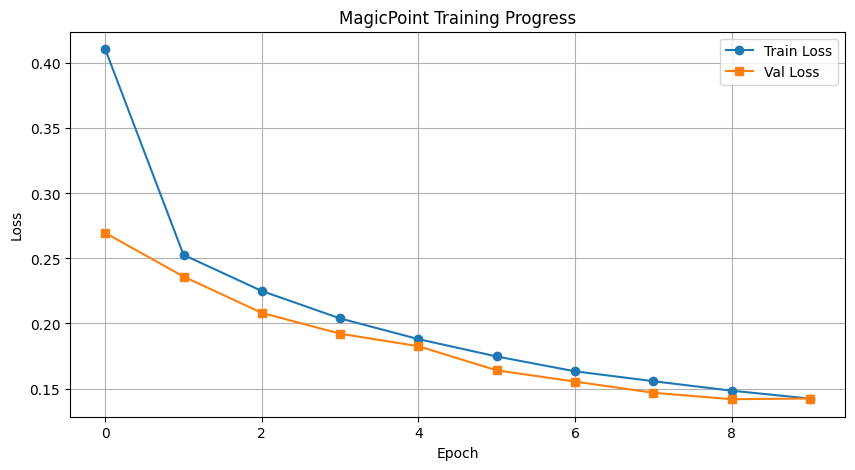


📊 Final Results:
Final Train Loss: 0.1423
Final Val Loss: 0.1423


In [ ]:
# Train the model!
train_losses, val_losses = train_magicpoint(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    num_epochs=10,
    lr=0.001
)

# Plot training curves
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Val Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('MagicPoint Training Progress')
plt.legend()
plt.grid(True)
plt.show()

print(f"\n📊 Final Results:")
print(f"Final Train Loss: {train_losses[-1]:.4f}")
print(f"Final Val Loss: {val_losses[-1]:.4f}")

In [ ]:
# Save your trained model
torch.save(model.state_dict(), 'superpoint_synthetic.pth')
print("Model saved successfully!")

Model saved successfully!


🔍 Visualizing model predictions...


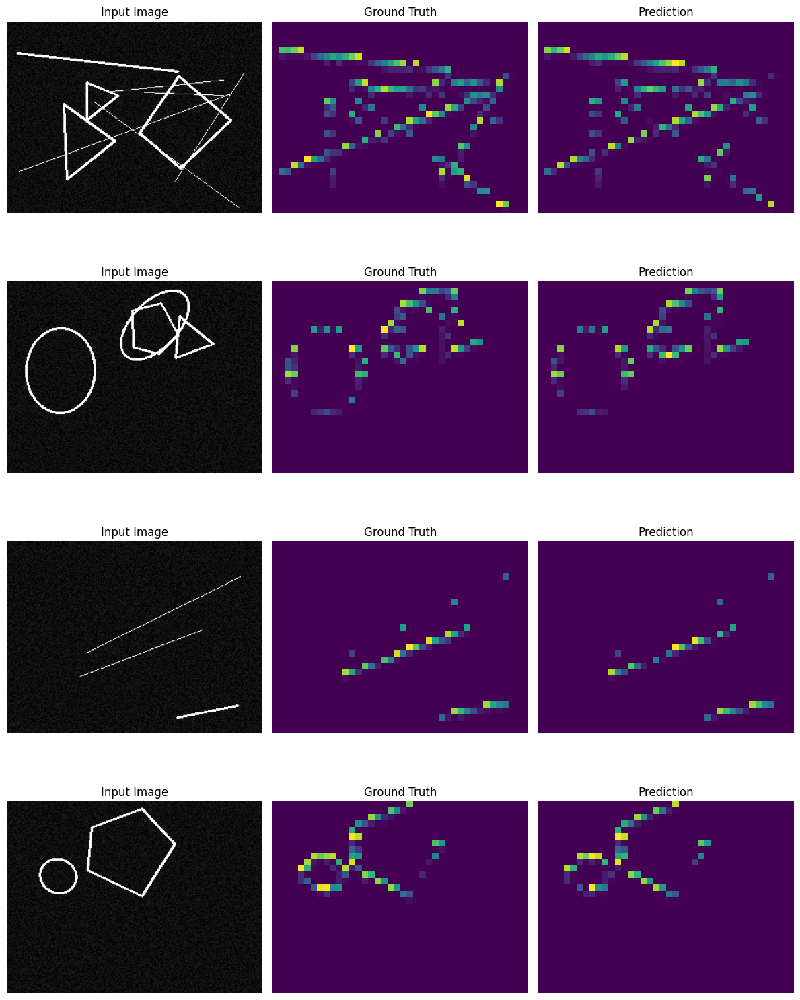


📈 Detection Statistics (on one batch):
Ground truth interest points: 873
Predicted interest points: 834
✅ MagicPoint phase complete!


In [ ]:
def visualize_predictions(model, dataset, device, num_samples=4):
    """Visualize model predictions vs ground truth"""
    model.eval()

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))

    with torch.no_grad():
        for i in range(num_samples):
            img, gt = dataset[i]
            img_input = img.unsqueeze(0).to(device)

            # Get predictions
            semi_pred, desc_pred = model(img_input)

            # Convert logits to probabilities and get predicted class
            probs = F.softmax(semi_pred, dim=1)  # [1, 65, H/8, W/8]
            pred_class = torch.argmax(probs, dim=1).squeeze().cpu().numpy()  # [H/8, W/8]

            # Get confidence (max probability)
            confidence = torch.max(probs, dim=1)[0].squeeze().cpu().numpy()

            # Visualize
            axes[i, 0].imshow(img.squeeze().cpu().numpy(), cmap='gray')
            axes[i, 0].set_title('Input Image')
            axes[i, 0].axis('off')

            axes[i, 1].imshow(gt.cpu().numpy(), cmap='viridis')
            axes[i, 1].set_title('Ground Truth')
            axes[i, 1].axis('off')

            axes[i, 2].imshow(pred_class, cmap='viridis')
            axes[i, 2].set_title('Prediction')
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize predictions on validation set
print("🔍 Visualizing model predictions...")
visualize_predictions(model, val_dataset, device, num_samples=4)

# Show detection statistics
model.eval()
with torch.no_grad():
    test_imgs, test_labels = next(iter(val_loader))
    test_imgs = test_imgs.to(device)

    semi_pred, _ = model(test_imgs)
    pred_class = torch.argmax(semi_pred, dim=1)

    # Count detected points (non-zero classes)
    num_detected = (pred_class > 0).sum().item()
    num_gt = (test_labels > 0).sum().item()

    print(f"\n📈 Detection Statistics (on one batch):")
    print(f"Ground truth interest points: {num_gt}")
    print(f"Predicted interest points: {num_detected}")
    print(f"✅ MagicPoint phase complete!")

In [ ]:
# Analyze the confidence distribution
model.eval()
with torch.no_grad():
    img, gt = val_dataset[0]
    img_input = img.unsqueeze(0).to(device)
    semi_pred, _ = model(img_input)

    # Get heatmap
    probs = F.softmax(semi_pred, dim=1)
    nodust = probs[:, :-1, :, :]
    B, _, Hc, Wc = nodust.shape
    heatmap = nodust.permute(0, 2, 3, 1).reshape(B, Hc, Wc, 8, 8)
    heatmap = heatmap.permute(0, 1, 3, 2, 4).reshape(B, Hc*8, Wc*8)

    heatmap_np = heatmap[0].cpu().numpy()

    print("📊 Confidence Score Statistics:")
    print(f"Min: {heatmap_np.min():.6f}")
    print(f"Max: {heatmap_np.max():.6f}")
    print(f"Mean: {heatmap_np.mean():.6f}")
    print(f"Median: {np.median(heatmap_np):.6f}")
    print(f"95th percentile: {np.percentile(heatmap_np, 95):.6f}")
    print(f"99th percentile: {np.percentile(heatmap_np, 99):.6f}")

📊 Confidence Score Statistics:
Min: 0.000000
Max: 1.000000
Mean: 0.015616
Median: 0.000000
95th percentile: 0.000216
99th percentile: 0.999999


In [ ]:
def simple_nms(scores, nms_radius=4):
    """Apply non-maximum suppression"""
    zeros = torch.zeros_like(scores)
    max_mask = scores == F.max_pool2d(
        scores.unsqueeze(0).unsqueeze(0),
        kernel_size=nms_radius*2+1,
        stride=1,
        padding=nms_radius
    ).squeeze()

    for _ in range(2):
        supp_mask = F.max_pool2d(
            max_mask.unsqueeze(0).unsqueeze(0).float(),
            kernel_size=nms_radius*2+1,
            stride=1,
            padding=nms_radius
        ).squeeze().bool()
        supp_scores = torch.where(supp_mask, scores, zeros)
        new_max_mask = supp_scores == F.max_pool2d(
            supp_scores.unsqueeze(0).unsqueeze(0),
            kernel_size=nms_radius*2+1,
            stride=1,
            padding=nms_radius
        ).squeeze()
        max_mask = max_mask | (new_max_mask & (~supp_mask))

    return torch.where(max_mask, scores, zeros)

def extract_keypoints(semi, conf_thresh=0.015, nms_dist=4):
    """Extract keypoints from network output"""
    probs = F.softmax(semi, dim=1)
    nodust = probs[:, :-1, :, :]

    B, _, Hc, Wc = nodust.shape
    heatmap = nodust.permute(0, 2, 3, 1).reshape(B, Hc, Wc, 8, 8)
    heatmap = heatmap.permute(0, 1, 3, 2, 4).reshape(B, Hc*8, Wc*8)

    keypoints_list = []

    for i in range(B):
        nms_heatmap = simple_nms(heatmap[i], nms_radius=nms_dist)
        keypoints_mask = nms_heatmap > conf_thresh
        keypoints = torch.nonzero(keypoints_mask)
        scores = nms_heatmap[keypoints_mask]
        keypoints_list.append((keypoints, scores))

    return keypoints_list, heatmap

print("✅ Keypoint extraction functions defined!")

✅ Keypoint extraction functions defined!


🔍 Visualizing MagicPoint results with threshold=0.9...


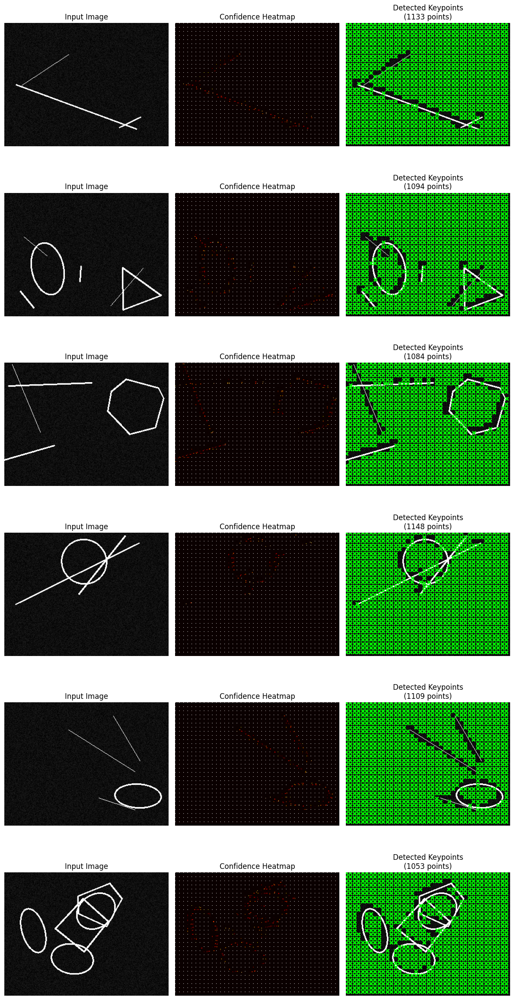


✅ MagicPoint visualization complete!
The green 'x' marks show detected corners on synthetic shapes.


In [ ]:
# Visualize with the correct threshold based on confidence stats [Not Necessary and can be removed]
def visualize_final_keypoints(model, dataset, device, num_samples=6, conf_thresh=0.9):
    """Visualize detected keypoints with proper threshold"""
    model.eval()

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))

    with torch.no_grad():
        for i in range(num_samples):
            img, gt = dataset[i]
            img_input = img.unsqueeze(0).to(device)

            # Get predictions
            semi_pred, _ = model(img_input)

            # Extract keypoints
            keypoints_list, heatmap = extract_keypoints(semi_pred, conf_thresh=conf_thresh)
            keypoints, scores = keypoints_list[0]

            # Convert to numpy
            img_np = img.squeeze().cpu().numpy()
            heatmap_np = heatmap[0].cpu().numpy()
            keypoints_np = keypoints.cpu().numpy()

            # Plot original image
            axes[i, 0].imshow(img_np, cmap='gray')
            axes[i, 0].set_title('Input Image')
            axes[i, 0].axis('off')

            # Plot heatmap
            axes[i, 1].imshow(heatmap_np, cmap='hot')
            axes[i, 1].set_title('Confidence Heatmap')
            axes[i, 1].axis('off')

            # Plot detected keypoints
            axes[i, 2].imshow(img_np, cmap='gray')
            if len(keypoints_np) > 0:
                axes[i, 2].scatter(keypoints_np[:, 1], keypoints_np[:, 0],
                                  c='lime', s=30, marker='x', linewidths=2)
            axes[i, 2].set_title(f'Detected Keypoints\n({len(keypoints_np)} points)')
            axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize final results
print("🔍 Visualizing MagicPoint results with threshold=0.9...")
visualize_final_keypoints(model, val_dataset, device, num_samples=6, conf_thresh=0.9)

print("\n✅ MagicPoint visualization complete!")
print("The green 'x' marks show detected corners on synthetic shapes.")

Number of keypoints detected: 1120
First 5 keypoint locations:
[[ 0  0]
 [ 0  8]
 [ 0 16]
 [ 0 24]
 [ 0 32]]


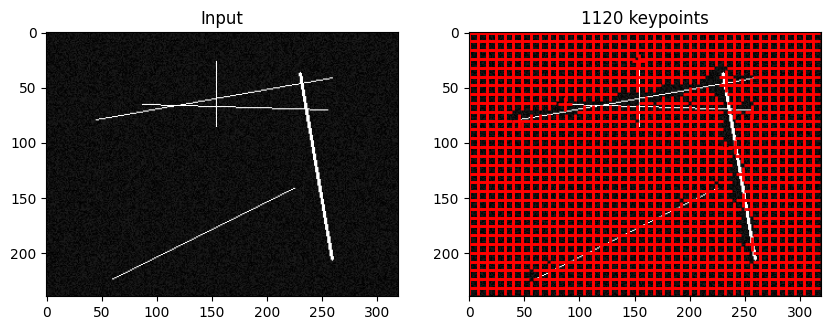

In [ ]:
# Simpler visualization [ Too many Keypoints]
model.eval()
img, gt = val_dataset[0]

with torch.no_grad():
    img_input = img.unsqueeze(0).to(device)
    semi_pred, _ = model(img_input)
    keypoints_list, heatmap = extract_keypoints(semi_pred, conf_thresh=0.9)
    keypoints, scores = keypoints_list[0]

print(f"Number of keypoints detected: {len(keypoints)}")
print(f"First 5 keypoint locations:\n{keypoints[:5].cpu().numpy()}")

# Simple plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img.squeeze().numpy(), cmap='gray')
plt.title('Input')

plt.subplot(1, 2, 2)
plt.imshow(img.squeeze().numpy(), cmap='gray')
if len(keypoints) > 0:
    kp = keypoints.cpu().numpy()
    plt.plot(kp[:, 1], kp[:, 0], 'r+', markersize=10, markeredgewidth=2)
plt.title(f'{len(keypoints)} keypoints')
plt.show()

Number of keypoints: 1071


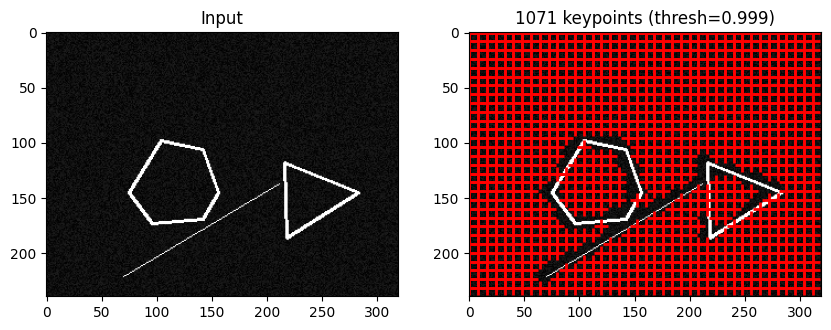

In [ ]:
# Try very high threshold [Too many keypoints]
model.eval()
img, gt = val_dataset[0]

with torch.no_grad():
    img_input = img.unsqueeze(0).to(device)
    semi_pred, _ = model(img_input)
    keypoints_list, heatmap = extract_keypoints(semi_pred, conf_thresh=0.999, nms_dist=4)
    keypoints, scores = keypoints_list[0]

print(f"Number of keypoints: {len(keypoints)}")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img.squeeze().numpy(), cmap='gray')
plt.title('Input')

plt.subplot(1, 2, 2)
plt.imshow(img.squeeze().numpy(), cmap='gray')
if len(keypoints) > 0:
    kp = keypoints.cpu().numpy()
    plt.plot(kp[:, 1], kp[:, 0], 'r+', markersize=10, markeredgewidth=2)
plt.title(f'{len(keypoints)} keypoints (thresh=0.999)')
plt.show()

In [ ]:
print("="*60)
print("PROJECT STATUS CHECK")
print("="*60)

# 1. Check if model is trained (architecture defined and on device)
# Assuming 'model' and 'device' are defined in previous executed cells
try:
    print(f"✓ Model architecture: {model.__class__.__name__}")
    print(f"✓ Model device: {next(model.parameters()).device}")
except NameError as e:
    print(f"✗ Model check failed: {e} (Make sure 'model' and 'device' are defined)")


# 2. Check dataset
# Assuming 'val_dataset' is defined in a previous executed cell
try:
    print(f"✓ Validation dataset size: {len(val_dataset)}")
except NameError as e:
    print(f"✗ Dataset check failed: {e} (Make sure 'val_dataset' is defined)")


# 3. Check if we have the functions/classes we need
components_needed = ['SyntheticShapes', 'extract_interest_points']
for comp_name in components_needed:
    if comp_name in dir():
        print(f"✓ Component '{comp_name}' available")
    else:
        print(f"✗ Component '{comp_name}' NOT FOUND")

# Verify Synthetic Shapes generation functionality
try:
    temp_generator = SyntheticShapes()
    temp_sample = temp_generator.generate_sample()
    if isinstance(temp_sample, np.ndarray) and temp_sample.shape == temp_generator.image_size:
        print(f"✓ Synthetic Shapes generator works (generated image of shape {temp_sample.shape})")
    else:
         print(f"✗ Synthetic Shapes generator failed or produced unexpected output")
except NameError as e:
    print(f"✗ Synthetic Shapes generator test failed: {e} (Make sure 'SyntheticShapes' class is defined)")
except Exception as e:
    print(f"✗ Error testing Synthetic Shapes generator: {e}")


# 4. Test a quick detection using the loaded model
try:
    # Use existing val_dataset and the loaded model
    test_img, test_gt = val_dataset[0]
    with torch.no_grad():
        test_input = test_img.unsqueeze(0).to(device)
        # Assuming model and extract_keypoints are defined
        test_pred, _ = model(test_input)
        test_kpts, test_heatmap = extract_keypoints(test_pred, conf_thresh=0.015, nms_dist=4)
    print(f"✓ Detection works: {len(test_kpts[0][0])} keypoints detected")
except NameError as e:
     print(f"✗ Detection test failed: {e} (Likely due to missing 'model', 'val_dataset' or 'extract_keypoints')")
except Exception as e:
    print(f"✗ Error during detection test: {e}")


print("\n" + "="*60)
print("READY FOR: Homographic Adaptation")
print("="*60)

PROJECT STATUS CHECK
✓ Model architecture: SuperPointNet
✓ Model device: cuda:0
✓ Validation dataset size: 500
✓ Component 'SyntheticShapes' available
✓ Component 'extract_interest_points' available
✓ Synthetic Shapes generator works (generated image of shape (240, 320))
✓ Detection works: 1191 keypoints detected

READY FOR: Homographic Adaptation


Homographic Adaptation on Synthetic Images


In [ ]:
import cv2

class HomographicAdaptation:
    """
    Applies homographic adaptation to generate pseudo-ground truth labels
    """

    def __init__(self, model, device='cuda', num_homographies=30):
        self.model = model
        self.device = device
        self.num_homographies = num_homographies
        self.model.eval()

    def generate_random_homography(self, img_shape, max_translation=0.2,
                                   max_rotation=45, max_scale=0.3, max_shear=0.2):
        """Generate a random homography matrix"""
        H, W = img_shape

        # Random parameters
        tx = np.random.uniform(-max_translation, max_translation) * W
        ty = np.random.uniform(-max_translation, max_translation) * H
        angle = np.random.uniform(-max_rotation, max_rotation)
        scale = np.random.uniform(1 - max_scale, 1 + max_scale)
        shear = np.random.uniform(-max_shear, max_shear)

        # Build transformation matrix
        cx, cy = W / 2, H / 2

        # Translation to origin
        T1 = np.array([[1, 0, -cx],
                       [0, 1, -cy],
                       [0, 0, 1]], dtype=np.float32)

        # Rotation + Scale
        rad = np.radians(angle)
        cos_a, sin_a = np.cos(rad), np.sin(rad)
        R = np.array([[scale * cos_a, -scale * sin_a, 0],
                      [scale * sin_a, scale * cos_a, 0],
                      [0, 0, 1]], dtype=np.float32)

        # Shear
        S = np.array([[1, shear, 0],
                      [0, 1, 0],
                      [0, 0, 1]], dtype=np.float32)

        # Translation back + random translation
        T2 = np.array([[1, 0, cx + tx],
                       [0, 1, cy + ty],
                       [0, 0, 1]], dtype=np.float32)

        # Combine: T2 * S * R * T1
        H_matrix = T2 @ S @ R @ T1
        return H_matrix

    def warp_image(self, img, H):
        """Warp image using homography"""
        h, w = img.shape
        warped = cv2.warpPerspective(img, H, (w, h))
        return warped

    def warp_points(self, points, H):
        """Warp keypoints using homography"""
        if len(points) == 0:
            return points

        # Convert to homogeneous coordinates
        ones = np.ones((points.shape[0], 1))
        points_h = np.concatenate([points, ones], axis=1)  # Nx3

        # Apply homography
        warped_h = (H @ points_h.T).T  # Nx3

        # Convert back to cartesian
        warped_points = warped_h[:, :2] / (warped_h[:, 2:3] + 1e-8)
        return warped_points

    def detect_keypoints(self, img_tensor, threshold=0.015, nms_dist=4):
        """Run detection on a single image using the network and extract_keypoints"""
        with torch.no_grad():
            semi_pred, _ = self.model(img_tensor)

            # Use extract_keypoints which takes the semi_pred output
            keypoints_list, heatmap = extract_keypoints(
                semi_pred, conf_thresh=threshold, nms_dist=nms_dist
            )
            # Assuming batch size of 1 for single image detection
            keypoints, scores = keypoints_list[0]


            if len(keypoints) == 0:
                return np.zeros((0, 2)), np.zeros(0)

            # Convert to numpy (x, y) format
            kpts_np = keypoints.cpu().numpy()
            scores_np = scores.cpu().numpy()

            # Convert from (row, col) to (x, y)
            kpts_xy = np.stack([kpts_np[:, 1], kpts_np[:, 0]], axis=1)

            return kpts_xy, scores_np


    def aggregate_detections(self, all_keypoints, all_scores, img_shape,
                            nms_radius=4, conf_threshold=0.015):
        """Aggregate keypoints from multiple homographies"""
        H, W = img_shape

        # Create accumulation grid
        accumulator = np.zeros((H, W), dtype=np.float32)
        count_map = np.zeros((H, W), dtype=np.int32)

        # Accumulate all detections
        for kpts, scores in zip(all_keypoints, all_scores):
            # Round and cast to integer coordinates
            kpts_int = np.round(kpts).astype(int)
            for (x, y), score in zip(kpts_int, scores):
                if 0 <= x < W and 0 <= y < H:
                    accumulator[y, x] += score
                    count_map[y, x] += 1

        # Normalize by count (average confidence)
        mask = count_map > 0
        accumulator[mask] /= count_map[mask]

        # Apply NMS
        final_keypoints = []
        final_scores = []

        # Iterate over potential keypoints above threshold
        coords = np.where(accumulator > conf_threshold)
        for y, x in zip(coords[0], coords[1]):
            score = accumulator[y, x]

            # Check if it's a local maximum within the NMS radius
            y_min = max(0, y - nms_radius)
            y_max = min(H, y + nms_radius + 1)
            x_min = max(0, x - nms_radius)
            x_max = min(W, x + nms_radius + 1)

            local_region = accumulator[y_min:y_max, x_min:x_max]

            if score == local_region.max():
                # Check for ties and only keep the first one encountered
                max_coords = np.argwhere(local_region == score)
                if len(max_coords) > 1:
                     # If this point is the first max in the local region, keep it
                     if max_coords[0][0] == (y - y_min) and max_coords[0][1] == (x - x_min):
                         final_keypoints.append([x, y])
                         final_scores.append(score)
                else:
                    final_keypoints.append([x, y])
                    final_scores.append(score)


        if len(final_keypoints) == 0:
            return np.zeros((0, 2)), np.zeros(0), accumulator

        return np.array(final_keypoints), np.array(final_scores), accumulator


    def apply_homographic_adaptation(self, img, threshold=0.015, nms_radius=4):
        """Apply full homographic adaptation pipeline"""
        H, W = img.shape
        all_keypoints = []
        all_scores = []

        print(f"Applying {self.num_homographies} homographies...")

        for i in range(self.num_homographies):
            if (i + 1) % 10 == 0:
                print(f"  Progress: {i + 1}/{self.num_homographies}")

            # Generate random homography
            H_matrix = self.generate_random_homography((H, W))
            H_inv = np.linalg.inv(H_matrix)

            # Warp image
            warped_img = self.warp_image(img, H_matrix)

            # Detect keypoints in warped image
            img_tensor = torch.from_numpy(warped_img).float().unsqueeze(0).unsqueeze(0).to(self.device)
            kpts, scores = self.detect_keypoints(img_tensor, threshold, nms_radius) # Call self.detect_keypoints


            # Warp keypoints back to original frame
            if len(kpts) > 0:
                kpts_original = self.warp_points(kpts, H_inv)
                all_keypoints.append(kpts_original)
                all_scores.append(scores)

        print("Aggregating detections...")

        # Aggregate all detections
        final_kpts, final_scores, accumulator = self.aggregate_detections(
            all_keypoints, all_scores, (H, W), nms_radius, threshold
        )

        print(f"✓ Final keypoints detected: {len(final_kpts)}")
        return final_kpts, final_scores, accumulator

print("✓ HomographicAdaptation class loaded!")

✓ HomographicAdaptation class loaded!


Testing Homographic Class on a synthetic Image

In [ ]:
import matplotlib.pyplot as plt

# Generate a test image
synthetic_gen = SyntheticShapes()
test_img = synthetic_gen.generate_sample()
print(f"Generated test image with shape: {test_img.shape}")

# Initialize homographic adaptation (start with 30 homographies)
ha = HomographicAdaptation(model=model, device='cuda', num_homographies=30)

# Get original detection
img_tensor = torch.from_numpy(test_img).float().unsqueeze(0).unsqueeze(0).cuda()
original_kpts, original_scores = ha.detect_keypoints(img_tensor, threshold=0.015)
print(f"Original detection: {len(original_kpts)} keypoints")

# Apply homographic adaptation
adapted_kpts, adapted_scores, accumulator = ha.apply_homographic_adaptation(
    test_img, threshold=0.015, nms_radius=4
)

print(f"\n{'='*60}")
print(f"Original Detection:  {len(original_kpts)} keypoints")
print(f"After Adaptation:    {len(adapted_kpts)} keypoints")
print(f"Improvement:         +{len(adapted_kpts) - len(original_kpts)} keypoints")
print(f"{'='*60}")

# Analyze score distributions
print("\nScore Statistics:")
print(f"Original - Min: {original_scores.min():.4f}, Max: {original_scores.max():.4f}, Mean: {original_scores.mean():.4f}")
if len(adapted_scores) > 0:
    print(f"Adapted  - Min: {adapted_scores.min():.4f}, Max: {adapted_scores.max():.4f}, Mean: {adapted_scores.mean():.4f}")

Generated test image with shape: (240, 320)
Original detection: 1180 keypoints
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...
✓ Final keypoints detected: 52

Original Detection:  1180 keypoints
After Adaptation:    52 keypoints
Improvement:         +-1128 keypoints

Score Statistics:
Original - Min: 0.5398, Max: 1.0000, Mean: 0.9958
Adapted  - Min: 1.0000, Max: 1.0000, Mean: 1.0000


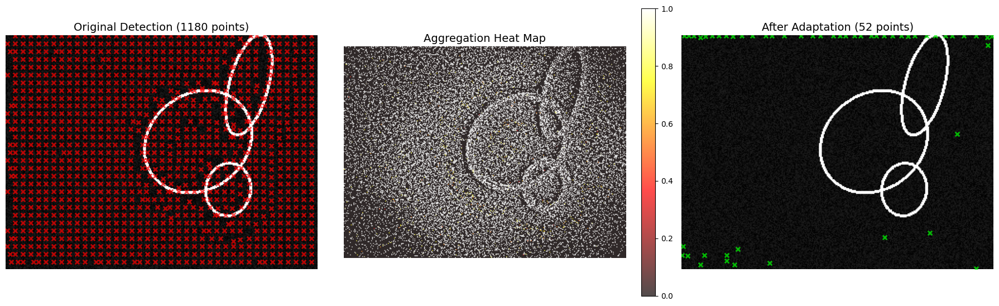

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original detection
axes[0].imshow(test_img, cmap='gray')
if len(original_kpts) > 0:
    axes[0].scatter(original_kpts[:, 0], original_kpts[:, 1],
                   c='red', s=30, alpha=0.7, marker='x', linewidths=2)
axes[0].set_title(f'Original Detection ({len(original_kpts)} points)', fontsize=14)
axes[0].axis('off')

# Aggregation heat map
axes[1].imshow(test_img, cmap='gray', alpha=0.5)
im = axes[1].imshow(accumulator, cmap='hot', alpha=0.7)
axes[1].set_title('Aggregation Heat Map', fontsize=14)
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)

# After homographic adaptation
axes[2].imshow(test_img, cmap='gray')
if len(adapted_kpts) > 0:
    axes[2].scatter(adapted_kpts[:, 0], adapted_kpts[:, 1],
                   c='lime', s=30, alpha=0.7, marker='x', linewidths=2)
axes[2].set_title(f'After Adaptation ({len(adapted_kpts)} points)', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

Downloading the MS-COCO Dataset


In [ ]:
import os
import urllib.request
from PIL import Image
import zipfile

# Create directory for COCO images
os.makedirs('coco_images', exist_ok=True)

print("Downloading MS-COCO sample images...")

# We'll download a small subset for the project (you can expand this later)
# Using COCO 2017 validation set
coco_url = "http://images.cocodataset.org/zips/val2017.zip"
zip_path = "val2017.zip"

# Download if not already downloaded
if not os.path.exists(zip_path):
    print("Downloading COCO validation set (this may take a few minutes)...")
    urllib.request.urlretrieve(coco_url, zip_path)
    print("✓ Download complete!")
else:
    print("✓ COCO zip file already exists")

# Extract
if not os.path.exists('val2017'):
    print("Extracting images...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall('.')
    print("✓ Extraction complete!")
else:
    print("✓ Images already extracted")

# Count images
num_images = len([f for f in os.listdir('val2017') if f.endswith('.jpg')])
print(f"\n✓ Ready! Found {num_images} COCO images")

✓ Download complete!
Extracting images...
✓ Extraction complete!

✓ Ready! Found 5000 COCO images


 Create COCO Dataset Class

Loaded 500 images from val2017
✓ COCO dataset ready with 500 images
✓ Test image loaded: val2017/000000000139.jpg, shape: (240, 320)


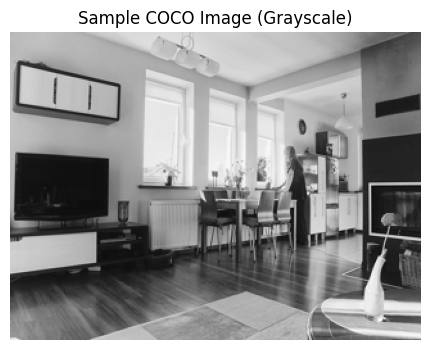

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import glob

class COCODataset(Dataset):
    """Dataset for MS-COCO images (grayscale, resized)"""

    def __init__(self, img_dir='val2017', img_size=(240, 320), max_images=1000):
        """
        Args:
            img_dir: Directory containing COCO images
            img_size: (H, W) to resize images to
            max_images: Maximum number of images to use
        """
        self.img_dir = img_dir
        self.img_size = img_size

        # Get all image paths
        self.img_paths = sorted(glob.glob(os.path.join(img_dir, '*.jpg')))[:max_images]
        print(f"Loaded {len(self.img_paths)} images from {img_dir}")

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        # Load image
        img_path = self.img_paths[idx]
        img = Image.open(img_path).convert('L')  # Convert to grayscale

        # Resize
        img = img.resize((self.img_size[1], self.img_size[0]))  # PIL uses (W, H)

        # Convert to numpy array and normalize to [0, 1]
        img_np = np.array(img, dtype=np.float32) / 255.0

        return img_np, img_path

# Create dataset (using 500 images for now)
coco_dataset = COCODataset(img_dir='val2017', img_size=(240, 320), max_images=500)
print(f"✓ COCO dataset ready with {len(coco_dataset)} images")

# Test: load one image
test_coco_img, test_path = coco_dataset[0]
print(f"✓ Test image loaded: {test_path}, shape: {test_coco_img.shape}")

# Visualize
plt.figure(figsize=(6, 4))
plt.imshow(test_coco_img, cmap='gray')
plt.title('Sample COCO Image (Grayscale)')
plt.axis('off')
plt.show()

Applying Homographic Adaptation on Real Images [ Pseudo Labels on 5 images as far as i understand ]

In [ ]:
# Apply homographic adaptation to a few COCO images
num_test_images = 5  # Start with just 5 images to test

print(f"Applying homographic adaptation to {num_test_images} COCO images...")
print("This will take a few minutes...\n")

results = []

for i in range(num_test_images):
    print(f"\n{'='*60}")
    print(f"Processing image {i+1}/{num_test_images}")
    print(f"{'='*60}")

    # Load COCO image
    coco_img, img_path = coco_dataset[i]
    print(f"Image: {os.path.basename(img_path)}")

    # Get original detection
    img_tensor = torch.from_numpy(coco_img).float().unsqueeze(0).unsqueeze(0).cuda()
    original_kpts, original_scores = ha.detect_keypoints(img_tensor, threshold=0.015)
    print(f"Original detection: {len(original_kpts)} keypoints")

    # Apply homographic adaptation
    adapted_kpts, adapted_scores, accumulator = ha.apply_homographic_adaptation(
        coco_img, threshold=0.015, nms_radius=4
    )

    print(f"After adaptation: {len(adapted_kpts)} keypoints")
    print(f"Improvement: +{len(adapted_kpts) - len(original_kpts)} keypoints")

    # Store results
    results.append({
        'image': coco_img,
        'path': img_path,
        'original_kpts': original_kpts,
        'adapted_kpts': adapted_kpts,
        'adapted_scores': adapted_scores,
        'accumulator': accumulator
    })

print(f"\n{'='*60}")
print("✓ Homographic adaptation complete for all images!")
print(f"{'='*60}")

Applying homographic adaptation to 5 COCO images...
This will take a few minutes...


Processing image 1/5
Image: 000000000139.jpg
Original detection: 1209 keypoints
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...
✓ Final keypoints detected: 555
After adaptation: 555 keypoints
Improvement: +-654 keypoints

Processing image 2/5
Image: 000000000285.jpg
Original detection: 1207 keypoints
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...
✓ Final keypoints detected: 615
After adaptation: 615 keypoints
Improvement: +-592 keypoints

Processing image 3/5
Image: 000000000632.jpg
Original detection: 1196 keypoints
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...
✓ Final keypoints detected: 546
After adaptation: 546 keypoints
Improvement: +-650 keypoints

Processing image 4/5
Image: 000000000724.jpg
Original detection: 120

 Visualize Results on Real Images

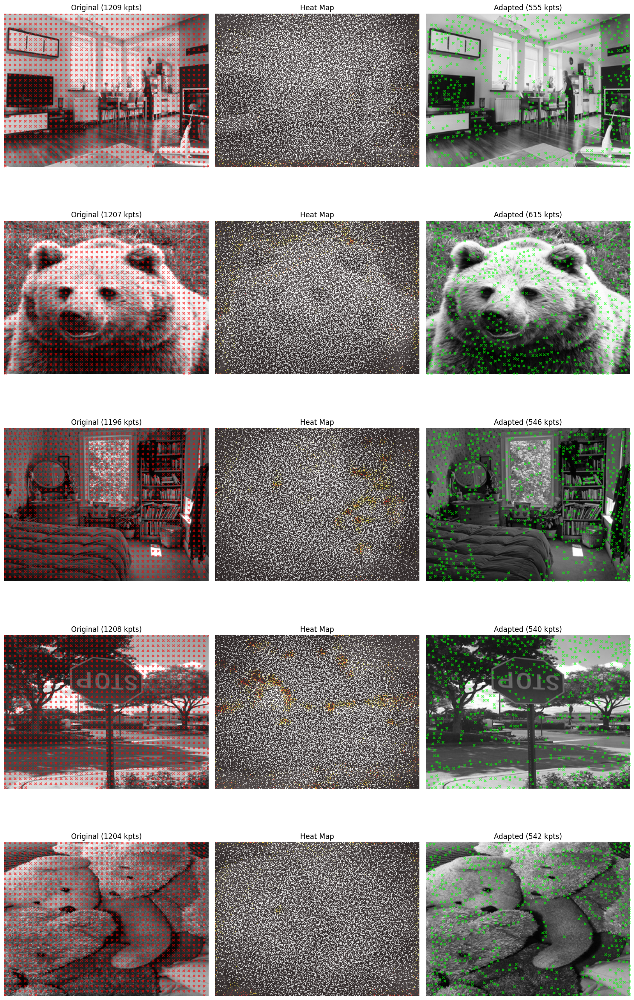


✓ Visualization complete!

Notice how:
- Heat maps show stable features (corners, edges)
- Adapted keypoints are MORE stable and repeatable
- Works on REAL images now, not just synthetic shapes!


In [ ]:
# Visualize results for all processed images
fig, axes = plt.subplots(num_test_images, 3, figsize=(15, 5*num_test_images))

for i, result in enumerate(results):
    img = result['image']
    orig_kpts = result['original_kpts']
    adapt_kpts = result['adapted_kpts']
    accumulator = result['accumulator']

    # Original detection
    axes[i, 0].imshow(img, cmap='gray')
    if len(orig_kpts) > 0:
        axes[i, 0].scatter(orig_kpts[:, 0], orig_kpts[:, 1],
                          c='red', s=15, alpha=0.6, marker='x')
    axes[i, 0].set_title(f'Original ({len(orig_kpts)} kpts)', fontsize=12)
    axes[i, 0].axis('off')

    # Heat map
    axes[i, 1].imshow(img, cmap='gray', alpha=0.5)
    im = axes[i, 1].imshow(accumulator, cmap='hot', alpha=0.7)
    axes[i, 1].set_title('Heat Map', fontsize=12)
    axes[i, 1].axis('off')

    # Adapted detection
    axes[i, 2].imshow(img, cmap='gray')
    if len(adapt_kpts) > 0:
        axes[i, 2].scatter(adapt_kpts[:, 0], adapt_kpts[:, 1],
                          c='lime', s=15, alpha=0.6, marker='x')
    axes[i, 2].set_title(f'Adapted ({len(adapt_kpts)} kpts)', fontsize=12)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n✓ Visualization complete!")
print("\nNotice how:")
print("- Heat maps show stable features (corners, edges)")
print("- Adapted keypoints are MORE stable and repeatable")
print("- Works on REAL images now, not just synthetic shapes!")

Generate Pseudo-Lables for all 500 images

In [ ]:
import pickle
from tqdm import tqdm
from sklearn.model_selection import train_test_split # You'll need this import

# Configuration
num_images_to_process = 500  # You can start with 100 for faster testing
save_interval = 50  # Save progress every 50 images
VAL_SPLIT_RATIO = 0.1  # 10% for validation

print(f"Generating pseudo-labels for {num_images_to_process} COCO images...")
print("This will take approximately 30-60 minutes. Please be patient!\n")

# Storage for pseudo-labels
pseudo_labels = []

# Process images with progress bar
for i in tqdm(range(num_images_to_process), desc="Processing images"):
    try:
        # Load COCO image
        # NOTE: 'coco_dataset' and 'ha' must be defined in previous cells
        coco_img, img_path = coco_dataset[i]

        # Apply homographic adaptation
        adapted_kpts, adapted_scores, accumulator = ha.apply_homographic_adaptation(
            coco_img, threshold=0.015, nms_radius=4
        )

        # Store pseudo-labels
        pseudo_labels.append({
            'image': coco_img,
            'keypoints': adapted_kpts,
            'scores': adapted_scores,
            'img_path': img_path
        })

        # Save checkpoint every save_interval images
        if (i + 1) % save_interval == 0:
            # Saving checkpoints is good practice, but not strictly needed for the split
            pass

    except Exception as e:
        print(f"\n✗ Error processing image {i}: {e}")
        continue

# --- MODIFICATIONS START HERE ---

# 1. Final save (optional, but good practice)
with open('pseudo_labels_final.pkl', 'wb') as f:
    pickle.dump(pseudo_labels, f)

# 2. Split into train and validation sets
if len(pseudo_labels) > 0:
    # Use train_test_split for a simple, random split
    train_pseudo, val_pseudo = train_test_split(
        pseudo_labels,
        test_size=VAL_SPLIT_RATIO,
        random_state=42 # Use a fixed seed for reproducibility
    )

    # 3. Print verification and final variables
    print(f"\n{'='*60}")
    print("✓ Pseudo-label generation and splitting complete!")
    print(f"✓ Total Processed Images: {len(pseudo_labels)}")
    print(f"✓ Created 'train_pseudo' with {len(train_pseudo)} images.")
    print(f"✓ Created 'val_pseudo' with {len(val_pseudo)} images.")
    print(f"{'='*60}")

else:
    # Handle the case where no images were processed
    train_pseudo = []
    val_pseudo = []
    print("\nWarning: No pseudo-labels were generated. 'train_pseudo' and 'val_pseudo' are empty lists.")


# Statistics (using the full list before splitting)
if len(pseudo_labels) > 0:
    total_keypoints = sum(len(pl['keypoints']) for pl in pseudo_labels)
    avg_keypoints = total_keypoints / len(pseudo_labels)
    print(f"\nStatistics (Full Set):")
    print(f"  Total keypoints: {total_keypoints}")
    print(f"  Average per image: {avg_keypoints:.1f}")
    print(f"  Min keypoints: {min(len(pl['keypoints']) for pl in pseudo_labels)}")
    print(f"  Max keypoints: {max(len(pl['keypoints']) for pl in pseudo_labels)}")

Generating pseudo-labels for 500 COCO images...
This will take approximately 30-60 minutes. Please be patient!



Processing images:   0%|          | 0/500 [00:00<?, ?it/s]

Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   0%|          | 1/500 [00:00<04:54,  1.70it/s]

✓ Final keypoints detected: 544
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   0%|          | 2/500 [00:01<04:50,  1.71it/s]

✓ Final keypoints detected: 627
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   1%|          | 3/500 [00:01<04:23,  1.89it/s]

✓ Final keypoints detected: 558
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   1%|          | 4/500 [00:01<03:46,  2.19it/s]

✓ Final keypoints detected: 664
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   1%|          | 5/500 [00:02<03:34,  2.31it/s]

✓ Final keypoints detected: 531
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   1%|          | 6/500 [00:02<03:15,  2.53it/s]

✓ Final keypoints detected: 815
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   1%|▏         | 7/500 [00:03<03:09,  2.60it/s]

✓ Final keypoints detected: 457
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   2%|▏         | 8/500 [00:03<02:59,  2.73it/s]

✓ Final keypoints detected: 700
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   2%|▏         | 9/500 [00:03<02:55,  2.79it/s]

✓ Final keypoints detected: 630
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   2%|▏         | 10/500 [00:04<02:52,  2.84it/s]

✓ Final keypoints detected: 582
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   2%|▏         | 11/500 [00:04<02:50,  2.87it/s]

✓ Final keypoints detected: 574
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   2%|▏         | 12/500 [00:04<02:49,  2.89it/s]

✓ Final keypoints detected: 584
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   3%|▎         | 13/500 [00:05<02:53,  2.80it/s]

✓ Final keypoints detected: 557
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   3%|▎         | 14/500 [00:05<02:48,  2.88it/s]

✓ Final keypoints detected: 616
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   3%|▎         | 15/500 [00:05<02:47,  2.90it/s]

✓ Final keypoints detected: 668
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   3%|▎         | 16/500 [00:06<02:45,  2.93it/s]

✓ Final keypoints detected: 528
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   3%|▎         | 17/500 [00:06<02:45,  2.93it/s]

✓ Final keypoints detected: 628
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   4%|▎         | 18/500 [00:06<02:46,  2.90it/s]

✓ Final keypoints detected: 554
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   4%|▍         | 19/500 [00:07<02:43,  2.94it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   4%|▍         | 20/500 [00:07<02:40,  3.00it/s]

✓ Final keypoints detected: 810
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   4%|▍         | 21/500 [00:07<02:41,  2.97it/s]

✓ Final keypoints detected: 688
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   4%|▍         | 22/500 [00:08<02:42,  2.95it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   5%|▍         | 23/500 [00:08<02:42,  2.94it/s]

✓ Final keypoints detected: 651
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   5%|▍         | 24/500 [00:08<02:48,  2.82it/s]

✓ Final keypoints detected: 570
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   5%|▌         | 25/500 [00:09<02:51,  2.78it/s]

✓ Final keypoints detected: 486
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   5%|▌         | 26/500 [00:09<02:47,  2.83it/s]

✓ Final keypoints detected: 646
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   5%|▌         | 27/500 [00:09<02:44,  2.87it/s]

✓ Final keypoints detected: 558
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   6%|▌         | 28/500 [00:10<02:40,  2.94it/s]

✓ Final keypoints detected: 730
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   6%|▌         | 29/500 [00:10<02:39,  2.95it/s]

✓ Final keypoints detected: 538
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   6%|▌         | 30/500 [00:10<02:45,  2.84it/s]

✓ Final keypoints detected: 454
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   6%|▌         | 31/500 [00:11<02:45,  2.83it/s]

✓ Final keypoints detected: 656
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   6%|▋         | 32/500 [00:11<03:09,  2.47it/s]

✓ Final keypoints detected: 538
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   7%|▋         | 33/500 [00:12<03:26,  2.26it/s]

✓ Final keypoints detected: 508
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   7%|▋         | 34/500 [00:12<03:34,  2.17it/s]

✓ Final keypoints detected: 583
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   7%|▋         | 35/500 [00:13<03:46,  2.05it/s]

✓ Final keypoints detected: 525
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   7%|▋         | 36/500 [00:13<03:43,  2.07it/s]

✓ Final keypoints detected: 657
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   7%|▋         | 37/500 [00:14<03:43,  2.07it/s]

✓ Final keypoints detected: 671
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   8%|▊         | 38/500 [00:14<03:49,  2.02it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   8%|▊         | 39/500 [00:15<03:28,  2.21it/s]

✓ Final keypoints detected: 669
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   8%|▊         | 40/500 [00:15<03:17,  2.33it/s]

✓ Final keypoints detected: 462
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   8%|▊         | 41/500 [00:15<03:03,  2.50it/s]

✓ Final keypoints detected: 602
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   8%|▊         | 42/500 [00:16<02:56,  2.59it/s]

✓ Final keypoints detected: 563
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   9%|▊         | 43/500 [00:16<02:48,  2.71it/s]

✓ Final keypoints detected: 617
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   9%|▉         | 44/500 [00:16<02:42,  2.80it/s]

✓ Final keypoints detected: 661
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   9%|▉         | 45/500 [00:17<02:42,  2.79it/s]

✓ Final keypoints detected: 613
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   9%|▉         | 46/500 [00:17<02:38,  2.86it/s]

✓ Final keypoints detected: 518
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:   9%|▉         | 47/500 [00:18<02:35,  2.92it/s]

✓ Final keypoints detected: 613
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  10%|▉         | 48/500 [00:18<02:32,  2.97it/s]

✓ Final keypoints detected: 729
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  10%|▉         | 49/500 [00:18<02:30,  3.00it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  10%|█         | 50/500 [00:19<02:33,  2.94it/s]

✓ Final keypoints detected: 552
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  10%|█         | 51/500 [00:19<02:35,  2.89it/s]

✓ Final keypoints detected: 535
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  10%|█         | 52/500 [00:19<02:31,  2.97it/s]

✓ Final keypoints detected: 704
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  11%|█         | 53/500 [00:20<02:36,  2.86it/s]

✓ Final keypoints detected: 485
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  11%|█         | 54/500 [00:20<02:36,  2.86it/s]

✓ Final keypoints detected: 788
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  11%|█         | 55/500 [00:20<02:33,  2.89it/s]

✓ Final keypoints detected: 613
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  11%|█         | 56/500 [00:21<02:40,  2.76it/s]

✓ Final keypoints detected: 609
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  11%|█▏        | 57/500 [00:21<02:39,  2.78it/s]

✓ Final keypoints detected: 542
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  12%|█▏        | 58/500 [00:21<02:34,  2.86it/s]

✓ Final keypoints detected: 570
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  12%|█▏        | 59/500 [00:22<02:32,  2.89it/s]

✓ Final keypoints detected: 633
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  12%|█▏        | 60/500 [00:22<02:30,  2.92it/s]

✓ Final keypoints detected: 534
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  12%|█▏        | 61/500 [00:22<02:30,  2.92it/s]

✓ Final keypoints detected: 545
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  12%|█▏        | 62/500 [00:23<02:27,  2.97it/s]

✓ Final keypoints detected: 621
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  13%|█▎        | 63/500 [00:23<02:24,  3.02it/s]

✓ Final keypoints detected: 691
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  13%|█▎        | 64/500 [00:23<02:22,  3.05it/s]

✓ Final keypoints detected: 669
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  13%|█▎        | 65/500 [00:24<02:26,  2.96it/s]

✓ Final keypoints detected: 555
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  13%|█▎        | 66/500 [00:24<02:26,  2.97it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  13%|█▎        | 67/500 [00:24<02:26,  2.96it/s]

✓ Final keypoints detected: 534
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  14%|█▎        | 68/500 [00:25<02:45,  2.61it/s]

✓ Final keypoints detected: 602
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  14%|█▍        | 69/500 [00:25<02:58,  2.41it/s]

✓ Final keypoints detected: 641
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  14%|█▍        | 70/500 [00:26<03:09,  2.27it/s]

✓ Final keypoints detected: 614
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  14%|█▍        | 71/500 [00:26<03:23,  2.11it/s]

✓ Final keypoints detected: 478
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  14%|█▍        | 72/500 [00:27<03:29,  2.04it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  15%|█▍        | 73/500 [00:27<03:30,  2.03it/s]

✓ Final keypoints detected: 734
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  15%|█▍        | 74/500 [00:28<03:28,  2.04it/s]

✓ Final keypoints detected: 683
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  15%|█▌        | 75/500 [00:28<03:10,  2.23it/s]

✓ Final keypoints detected: 781
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  15%|█▌        | 76/500 [00:29<02:56,  2.40it/s]

✓ Final keypoints detected: 653
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  15%|█▌        | 77/500 [00:29<02:53,  2.44it/s]

✓ Final keypoints detected: 368
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  16%|█▌        | 78/500 [00:29<02:44,  2.56it/s]

✓ Final keypoints detected: 574
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  16%|█▌        | 79/500 [00:30<02:37,  2.68it/s]

✓ Final keypoints detected: 685
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  16%|█▌        | 80/500 [00:30<02:32,  2.76it/s]

✓ Final keypoints detected: 716
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  16%|█▌        | 81/500 [00:30<02:27,  2.84it/s]

✓ Final keypoints detected: 823
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  16%|█▋        | 82/500 [00:31<02:24,  2.90it/s]

✓ Final keypoints detected: 728
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  17%|█▋        | 83/500 [00:31<02:25,  2.87it/s]

✓ Final keypoints detected: 586
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  17%|█▋        | 84/500 [00:31<02:28,  2.80it/s]

✓ Final keypoints detected: 518
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  17%|█▋        | 85/500 [00:32<02:24,  2.86it/s]

✓ Final keypoints detected: 658
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  17%|█▋        | 86/500 [00:32<02:23,  2.89it/s]

✓ Final keypoints detected: 648
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  17%|█▋        | 87/500 [00:32<02:25,  2.85it/s]

✓ Final keypoints detected: 569
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  18%|█▊        | 88/500 [00:33<02:21,  2.92it/s]

✓ Final keypoints detected: 630
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  18%|█▊        | 89/500 [00:33<02:18,  2.97it/s]

✓ Final keypoints detected: 653
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  18%|█▊        | 90/500 [00:33<02:20,  2.91it/s]

✓ Final keypoints detected: 725
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  18%|█▊        | 91/500 [00:34<02:17,  2.97it/s]

✓ Final keypoints detected: 582
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  18%|█▊        | 92/500 [00:34<02:17,  2.97it/s]

✓ Final keypoints detected: 710
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  19%|█▊        | 93/500 [00:34<02:18,  2.94it/s]

✓ Final keypoints detected: 684
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  19%|█▉        | 94/500 [00:35<02:17,  2.94it/s]

✓ Final keypoints detected: 641
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  19%|█▉        | 95/500 [00:35<02:18,  2.92it/s]

✓ Final keypoints detected: 654
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  19%|█▉        | 96/500 [00:35<02:22,  2.84it/s]

✓ Final keypoints detected: 555
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  19%|█▉        | 97/500 [00:36<02:18,  2.91it/s]

✓ Final keypoints detected: 722
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  20%|█▉        | 98/500 [00:36<02:16,  2.94it/s]

✓ Final keypoints detected: 626
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  20%|█▉        | 99/500 [00:36<02:18,  2.91it/s]

✓ Final keypoints detected: 589
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  20%|██        | 100/500 [00:37<02:18,  2.89it/s]

✓ Final keypoints detected: 513
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  20%|██        | 101/500 [00:37<02:17,  2.91it/s]

✓ Final keypoints detected: 593
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  20%|██        | 102/500 [00:38<02:20,  2.84it/s]

✓ Final keypoints detected: 545
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  21%|██        | 103/500 [00:38<02:28,  2.67it/s]

✓ Final keypoints detected: 575
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  21%|██        | 104/500 [00:38<02:43,  2.43it/s]

✓ Final keypoints detected: 672
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  21%|██        | 105/500 [00:39<02:54,  2.27it/s]

✓ Final keypoints detected: 642
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  21%|██        | 106/500 [00:40<03:07,  2.10it/s]

✓ Final keypoints detected: 563
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  21%|██▏       | 107/500 [00:40<03:08,  2.09it/s]

✓ Final keypoints detected: 588
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  22%|██▏       | 108/500 [00:41<03:13,  2.03it/s]

✓ Final keypoints detected: 660
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  22%|██▏       | 109/500 [00:41<03:14,  2.01it/s]

✓ Final keypoints detected: 722
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  22%|██▏       | 110/500 [00:41<02:57,  2.19it/s]

✓ Final keypoints detected: 718
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  22%|██▏       | 111/500 [00:42<02:43,  2.38it/s]

✓ Final keypoints detected: 647
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  22%|██▏       | 112/500 [00:42<02:32,  2.55it/s]

✓ Final keypoints detected: 643
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  23%|██▎       | 113/500 [00:42<02:24,  2.69it/s]

✓ Final keypoints detected: 694
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  23%|██▎       | 114/500 [00:43<02:21,  2.73it/s]

✓ Final keypoints detected: 654
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  23%|██▎       | 115/500 [00:43<02:18,  2.78it/s]

✓ Final keypoints detected: 623
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  23%|██▎       | 116/500 [00:43<02:15,  2.84it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  23%|██▎       | 117/500 [00:44<02:14,  2.84it/s]

✓ Final keypoints detected: 600
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  24%|██▎       | 118/500 [00:44<02:10,  2.92it/s]

✓ Final keypoints detected: 627
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  24%|██▍       | 119/500 [00:44<02:09,  2.94it/s]

✓ Final keypoints detected: 638
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  24%|██▍       | 120/500 [00:45<02:09,  2.94it/s]

✓ Final keypoints detected: 642
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  24%|██▍       | 121/500 [00:45<02:05,  3.02it/s]

✓ Final keypoints detected: 740
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  24%|██▍       | 122/500 [00:45<02:04,  3.04it/s]

✓ Final keypoints detected: 692
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  25%|██▍       | 123/500 [00:46<02:06,  2.98it/s]

✓ Final keypoints detected: 609
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  25%|██▍       | 124/500 [00:46<02:06,  2.96it/s]

✓ Final keypoints detected: 583
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  25%|██▌       | 125/500 [00:46<02:07,  2.93it/s]

✓ Final keypoints detected: 529
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  25%|██▌       | 126/500 [00:47<02:09,  2.89it/s]

✓ Final keypoints detected: 508
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  25%|██▌       | 127/500 [00:47<02:07,  2.92it/s]

✓ Final keypoints detected: 574
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  26%|██▌       | 128/500 [00:48<02:07,  2.91it/s]

✓ Final keypoints detected: 641
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  26%|██▌       | 129/500 [00:48<02:08,  2.88it/s]

✓ Final keypoints detected: 568
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  26%|██▌       | 130/500 [00:48<02:07,  2.90it/s]

✓ Final keypoints detected: 596
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  26%|██▌       | 131/500 [00:49<02:07,  2.90it/s]

✓ Final keypoints detected: 626
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  26%|██▋       | 132/500 [00:49<02:07,  2.88it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  27%|██▋       | 133/500 [00:49<02:05,  2.92it/s]

✓ Final keypoints detected: 651
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  27%|██▋       | 134/500 [00:50<02:06,  2.89it/s]

✓ Final keypoints detected: 590
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  27%|██▋       | 135/500 [00:50<02:07,  2.86it/s]

✓ Final keypoints detected: 529
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  27%|██▋       | 136/500 [00:50<02:03,  2.94it/s]

✓ Final keypoints detected: 691
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  27%|██▋       | 137/500 [00:51<02:05,  2.90it/s]

✓ Final keypoints detected: 623
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  28%|██▊       | 138/500 [00:51<02:05,  2.89it/s]

✓ Final keypoints detected: 622
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  28%|██▊       | 139/500 [00:51<02:12,  2.73it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  28%|██▊       | 140/500 [00:52<02:24,  2.49it/s]

✓ Final keypoints detected: 743
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  28%|██▊       | 141/500 [00:52<02:34,  2.33it/s]

✓ Final keypoints detected: 673
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  28%|██▊       | 142/500 [00:53<02:42,  2.21it/s]

✓ Final keypoints detected: 655
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  29%|██▊       | 143/500 [00:53<02:52,  2.07it/s]

✓ Final keypoints detected: 490
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  29%|██▉       | 144/500 [00:54<03:38,  1.63it/s]

✓ Final keypoints detected: 595
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  29%|██▉       | 145/500 [00:55<04:02,  1.46it/s]

✓ Final keypoints detected: 761
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  29%|██▉       | 146/500 [00:56<03:26,  1.71it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  29%|██▉       | 147/500 [00:56<03:25,  1.72it/s]

✓ Final keypoints detected: 740
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  30%|██▉       | 148/500 [00:56<02:58,  1.98it/s]

✓ Final keypoints detected: 641
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  30%|██▉       | 149/500 [00:57<02:38,  2.21it/s]

✓ Final keypoints detected: 721
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  30%|███       | 150/500 [00:57<02:25,  2.40it/s]

✓ Final keypoints detected: 651
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  30%|███       | 151/500 [00:57<02:19,  2.51it/s]

✓ Final keypoints detected: 598
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  30%|███       | 152/500 [00:58<02:12,  2.63it/s]

✓ Final keypoints detected: 726
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  31%|███       | 153/500 [00:58<02:07,  2.71it/s]

✓ Final keypoints detected: 590
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  31%|███       | 154/500 [00:58<02:05,  2.75it/s]

✓ Final keypoints detected: 625
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  31%|███       | 155/500 [00:59<02:01,  2.85it/s]

✓ Final keypoints detected: 709
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  31%|███       | 156/500 [00:59<02:00,  2.87it/s]

✓ Final keypoints detected: 614
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  31%|███▏      | 157/500 [01:00<02:00,  2.85it/s]

✓ Final keypoints detected: 621
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  32%|███▏      | 158/500 [01:00<02:01,  2.81it/s]

✓ Final keypoints detected: 471
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  32%|███▏      | 159/500 [01:00<01:58,  2.89it/s]

✓ Final keypoints detected: 656
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  32%|███▏      | 160/500 [01:01<01:56,  2.92it/s]

✓ Final keypoints detected: 685
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  32%|███▏      | 161/500 [01:01<01:54,  2.95it/s]

✓ Final keypoints detected: 668
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  32%|███▏      | 162/500 [01:01<01:53,  2.99it/s]

✓ Final keypoints detected: 582
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  33%|███▎      | 163/500 [01:02<01:52,  3.00it/s]

✓ Final keypoints detected: 694
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  33%|███▎      | 164/500 [01:02<01:51,  3.00it/s]

✓ Final keypoints detected: 581
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  33%|███▎      | 165/500 [01:02<01:52,  2.97it/s]

✓ Final keypoints detected: 578
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  33%|███▎      | 166/500 [01:03<01:55,  2.90it/s]

✓ Final keypoints detected: 633
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  33%|███▎      | 167/500 [01:03<01:53,  2.94it/s]

✓ Final keypoints detected: 690
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  34%|███▎      | 168/500 [01:03<01:52,  2.96it/s]

✓ Final keypoints detected: 587
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  34%|███▍      | 169/500 [01:04<01:52,  2.94it/s]

✓ Final keypoints detected: 713
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  34%|███▍      | 170/500 [01:04<01:53,  2.90it/s]

✓ Final keypoints detected: 495
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  34%|███▍      | 171/500 [01:04<01:52,  2.91it/s]

✓ Final keypoints detected: 565
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  34%|███▍      | 172/500 [01:05<01:55,  2.84it/s]

✓ Final keypoints detected: 554
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  35%|███▍      | 173/500 [01:05<02:01,  2.69it/s]

✓ Final keypoints detected: 553
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  35%|███▍      | 174/500 [01:06<02:15,  2.40it/s]

✓ Final keypoints detected: 779
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  35%|███▌      | 175/500 [01:06<02:26,  2.22it/s]

✓ Final keypoints detected: 576
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  35%|███▌      | 176/500 [01:07<02:36,  2.07it/s]

✓ Final keypoints detected: 559
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  35%|███▌      | 177/500 [01:07<02:39,  2.03it/s]

✓ Final keypoints detected: 553
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  36%|███▌      | 178/500 [01:08<02:42,  1.98it/s]

✓ Final keypoints detected: 612
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  36%|███▌      | 179/500 [01:08<02:43,  1.97it/s]

✓ Final keypoints detected: 744
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  36%|███▌      | 180/500 [01:09<02:35,  2.06it/s]

✓ Final keypoints detected: 512
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  36%|███▌      | 181/500 [01:09<02:21,  2.26it/s]

✓ Final keypoints detected: 719
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  36%|███▋      | 182/500 [01:09<02:09,  2.45it/s]

✓ Final keypoints detected: 657
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  37%|███▋      | 183/500 [01:10<02:04,  2.54it/s]

✓ Final keypoints detected: 509
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  37%|███▋      | 184/500 [01:10<01:59,  2.65it/s]

✓ Final keypoints detected: 670
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  37%|███▋      | 185/500 [01:10<01:57,  2.68it/s]

✓ Final keypoints detected: 498
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  37%|███▋      | 186/500 [01:11<01:53,  2.78it/s]

✓ Final keypoints detected: 766
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  37%|███▋      | 187/500 [01:11<01:51,  2.80it/s]

✓ Final keypoints detected: 804
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  38%|███▊      | 188/500 [01:11<01:49,  2.85it/s]

✓ Final keypoints detected: 672
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  38%|███▊      | 189/500 [01:12<01:48,  2.88it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  38%|███▊      | 190/500 [01:12<01:47,  2.89it/s]

✓ Final keypoints detected: 717
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  38%|███▊      | 191/500 [01:12<01:45,  2.92it/s]

✓ Final keypoints detected: 652
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  38%|███▊      | 192/500 [01:13<01:44,  2.94it/s]

✓ Final keypoints detected: 656
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  39%|███▊      | 193/500 [01:13<01:47,  2.86it/s]

✓ Final keypoints detected: 515
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  39%|███▉      | 194/500 [01:13<01:45,  2.89it/s]

✓ Final keypoints detected: 595
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  39%|███▉      | 195/500 [01:14<01:44,  2.91it/s]

✓ Final keypoints detected: 518
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  39%|███▉      | 196/500 [01:14<01:49,  2.77it/s]

✓ Final keypoints detected: 447
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  39%|███▉      | 197/500 [01:15<01:45,  2.87it/s]

✓ Final keypoints detected: 736
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  40%|███▉      | 198/500 [01:15<01:43,  2.93it/s]

✓ Final keypoints detected: 722
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  40%|███▉      | 199/500 [01:15<01:45,  2.85it/s]

✓ Final keypoints detected: 543
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  40%|████      | 200/500 [01:16<01:42,  2.94it/s]

✓ Final keypoints detected: 719
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  40%|████      | 201/500 [01:16<01:40,  2.98it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  40%|████      | 202/500 [01:16<01:39,  2.99it/s]

✓ Final keypoints detected: 717
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  41%|████      | 203/500 [01:17<01:38,  3.01it/s]

✓ Final keypoints detected: 683
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  41%|████      | 204/500 [01:17<01:41,  2.92it/s]

✓ Final keypoints detected: 552
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  41%|████      | 205/500 [01:17<01:43,  2.84it/s]

✓ Final keypoints detected: 597
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  41%|████      | 206/500 [01:18<01:41,  2.88it/s]

✓ Final keypoints detected: 569
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  41%|████▏     | 207/500 [01:18<01:41,  2.88it/s]

✓ Final keypoints detected: 585
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  42%|████▏     | 208/500 [01:18<01:40,  2.90it/s]

✓ Final keypoints detected: 718
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  42%|████▏     | 209/500 [01:19<01:54,  2.55it/s]

✓ Final keypoints detected: 522
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  42%|████▏     | 210/500 [01:19<02:04,  2.34it/s]

✓ Final keypoints detected: 698
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  42%|████▏     | 211/500 [01:20<02:09,  2.23it/s]

✓ Final keypoints detected: 691
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  42%|████▏     | 212/500 [01:20<02:15,  2.12it/s]

✓ Final keypoints detected: 679
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  43%|████▎     | 213/500 [01:21<02:16,  2.10it/s]

✓ Final keypoints detected: 734
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  43%|████▎     | 214/500 [01:21<02:23,  1.99it/s]

✓ Final keypoints detected: 803
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  43%|████▎     | 215/500 [01:22<02:29,  1.91it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  43%|████▎     | 216/500 [01:22<02:15,  2.09it/s]

✓ Final keypoints detected: 645
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  43%|████▎     | 217/500 [01:23<02:05,  2.26it/s]

✓ Final keypoints detected: 630
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  44%|████▎     | 218/500 [01:23<01:57,  2.40it/s]

✓ Final keypoints detected: 564
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  44%|████▍     | 219/500 [01:23<01:51,  2.51it/s]

✓ Final keypoints detected: 602
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  44%|████▍     | 220/500 [01:24<01:45,  2.66it/s]

✓ Final keypoints detected: 649
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  44%|████▍     | 221/500 [01:24<01:40,  2.77it/s]

✓ Final keypoints detected: 605
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  44%|████▍     | 222/500 [01:24<01:38,  2.83it/s]

✓ Final keypoints detected: 671
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  45%|████▍     | 223/500 [01:25<01:40,  2.76it/s]

✓ Final keypoints detected: 539
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  45%|████▍     | 224/500 [01:25<01:37,  2.84it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  45%|████▌     | 225/500 [01:25<01:35,  2.87it/s]

✓ Final keypoints detected: 567
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  45%|████▌     | 226/500 [01:26<01:34,  2.88it/s]

✓ Final keypoints detected: 636
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  45%|████▌     | 227/500 [01:26<01:34,  2.90it/s]

✓ Final keypoints detected: 557
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  46%|████▌     | 228/500 [01:26<01:37,  2.80it/s]

✓ Final keypoints detected: 537
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  46%|████▌     | 229/500 [01:27<01:51,  2.42it/s]

✓ Final keypoints detected: 682
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  46%|████▌     | 230/500 [01:28<02:00,  2.25it/s]

✓ Final keypoints detected: 755
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  46%|████▌     | 231/500 [01:28<01:57,  2.29it/s]

✓ Final keypoints detected: 625
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  46%|████▋     | 232/500 [01:29<02:08,  2.08it/s]

✓ Final keypoints detected: 684
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  47%|████▋     | 233/500 [01:29<01:56,  2.29it/s]

✓ Final keypoints detected: 647
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  47%|████▋     | 234/500 [01:29<01:47,  2.47it/s]

✓ Final keypoints detected: 680
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  47%|████▋     | 235/500 [01:30<01:40,  2.63it/s]

✓ Final keypoints detected: 598
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  47%|████▋     | 236/500 [01:30<01:37,  2.71it/s]

✓ Final keypoints detected: 570
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  47%|████▋     | 237/500 [01:30<01:36,  2.74it/s]

✓ Final keypoints detected: 598
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  48%|████▊     | 238/500 [01:31<01:34,  2.78it/s]

✓ Final keypoints detected: 618
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  48%|████▊     | 239/500 [01:31<01:33,  2.79it/s]

✓ Final keypoints detected: 593
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  48%|████▊     | 240/500 [01:31<01:31,  2.83it/s]

✓ Final keypoints detected: 698
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  48%|████▊     | 241/500 [01:32<01:29,  2.89it/s]

✓ Final keypoints detected: 715
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  48%|████▊     | 242/500 [01:32<01:29,  2.88it/s]

✓ Final keypoints detected: 611
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  49%|████▊     | 243/500 [01:32<01:40,  2.55it/s]

✓ Final keypoints detected: 704
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  49%|████▉     | 244/500 [01:33<01:50,  2.31it/s]

✓ Final keypoints detected: 674
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  49%|████▉     | 245/500 [01:34<01:57,  2.16it/s]

✓ Final keypoints detected: 589
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  49%|████▉     | 246/500 [01:34<02:03,  2.06it/s]

✓ Final keypoints detected: 576
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  49%|████▉     | 247/500 [01:35<02:05,  2.02it/s]

✓ Final keypoints detected: 625
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  50%|████▉     | 248/500 [01:35<02:07,  1.98it/s]

✓ Final keypoints detected: 672
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  50%|████▉     | 249/500 [01:36<02:09,  1.94it/s]

✓ Final keypoints detected: 549
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  50%|█████     | 250/500 [01:36<01:58,  2.12it/s]

✓ Final keypoints detected: 508
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  50%|█████     | 251/500 [01:36<01:47,  2.32it/s]

✓ Final keypoints detected: 682
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  50%|█████     | 252/500 [01:37<01:39,  2.49it/s]

✓ Final keypoints detected: 685
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  51%|█████     | 253/500 [01:37<01:35,  2.59it/s]

✓ Final keypoints detected: 557
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  51%|█████     | 254/500 [01:37<01:30,  2.71it/s]

✓ Final keypoints detected: 662
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  51%|█████     | 255/500 [01:38<01:28,  2.77it/s]

✓ Final keypoints detected: 631
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  51%|█████     | 256/500 [01:38<01:28,  2.75it/s]

✓ Final keypoints detected: 611
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  51%|█████▏    | 257/500 [01:38<01:25,  2.83it/s]

✓ Final keypoints detected: 784
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  52%|█████▏    | 258/500 [01:39<01:26,  2.81it/s]

✓ Final keypoints detected: 552
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  52%|█████▏    | 259/500 [01:39<01:26,  2.79it/s]

✓ Final keypoints detected: 594
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  52%|█████▏    | 260/500 [01:40<01:27,  2.75it/s]

✓ Final keypoints detected: 608
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  52%|█████▏    | 261/500 [01:40<01:25,  2.79it/s]

✓ Final keypoints detected: 572
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  52%|█████▏    | 262/500 [01:40<01:25,  2.78it/s]

✓ Final keypoints detected: 589
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  53%|█████▎    | 263/500 [01:41<01:22,  2.86it/s]

✓ Final keypoints detected: 667
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  53%|█████▎    | 264/500 [01:41<01:22,  2.88it/s]

✓ Final keypoints detected: 593
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  53%|█████▎    | 265/500 [01:41<01:22,  2.85it/s]

✓ Final keypoints detected: 648
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  53%|█████▎    | 266/500 [01:42<01:21,  2.88it/s]

✓ Final keypoints detected: 666
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  53%|█████▎    | 267/500 [01:42<01:23,  2.78it/s]

✓ Final keypoints detected: 514
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  54%|█████▎    | 268/500 [01:42<01:24,  2.75it/s]

✓ Final keypoints detected: 548
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  54%|█████▍    | 269/500 [01:43<01:22,  2.79it/s]

✓ Final keypoints detected: 503
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  54%|█████▍    | 270/500 [01:43<01:21,  2.83it/s]

✓ Final keypoints detected: 536
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  54%|█████▍    | 271/500 [01:43<01:20,  2.83it/s]

✓ Final keypoints detected: 644
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  54%|█████▍    | 272/500 [01:44<01:19,  2.86it/s]

✓ Final keypoints detected: 646
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  55%|█████▍    | 273/500 [01:44<01:18,  2.91it/s]

✓ Final keypoints detected: 652
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  55%|█████▍    | 274/500 [01:44<01:19,  2.85it/s]

✓ Final keypoints detected: 561
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  55%|█████▌    | 275/500 [01:45<01:17,  2.89it/s]

✓ Final keypoints detected: 602
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  55%|█████▌    | 276/500 [01:45<01:16,  2.94it/s]

✓ Final keypoints detected: 626
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  55%|█████▌    | 277/500 [01:45<01:16,  2.91it/s]

✓ Final keypoints detected: 625
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  56%|█████▌    | 278/500 [01:46<01:25,  2.60it/s]

✓ Final keypoints detected: 662
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  56%|█████▌    | 279/500 [01:46<01:34,  2.34it/s]

✓ Final keypoints detected: 632
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  56%|█████▌    | 280/500 [01:47<01:39,  2.22it/s]

✓ Final keypoints detected: 616
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  56%|█████▌    | 281/500 [01:47<01:43,  2.11it/s]

✓ Final keypoints detected: 695
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  56%|█████▋    | 282/500 [01:48<01:43,  2.10it/s]

✓ Final keypoints detected: 745
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  57%|█████▋    | 283/500 [01:48<01:45,  2.05it/s]

✓ Final keypoints detected: 605
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  57%|█████▋    | 284/500 [01:49<01:50,  1.96it/s]

✓ Final keypoints detected: 542
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  57%|█████▋    | 285/500 [01:49<01:39,  2.16it/s]

✓ Final keypoints detected: 606
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  57%|█████▋    | 286/500 [01:50<01:36,  2.22it/s]

✓ Final keypoints detected: 382
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  57%|█████▋    | 287/500 [01:50<01:28,  2.41it/s]

✓ Final keypoints detected: 723
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  58%|█████▊    | 288/500 [01:50<01:23,  2.52it/s]

✓ Final keypoints detected: 622
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  58%|█████▊    | 289/500 [01:51<01:19,  2.64it/s]

✓ Final keypoints detected: 623
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  58%|█████▊    | 290/500 [01:51<01:16,  2.74it/s]

✓ Final keypoints detected: 653
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  58%|█████▊    | 291/500 [01:52<01:14,  2.79it/s]

✓ Final keypoints detected: 612
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  58%|█████▊    | 292/500 [01:52<01:16,  2.71it/s]

✓ Final keypoints detected: 493
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  59%|█████▊    | 293/500 [01:52<01:15,  2.74it/s]

✓ Final keypoints detected: 526
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  59%|█████▉    | 294/500 [01:53<01:13,  2.80it/s]

✓ Final keypoints detected: 656
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  59%|█████▉    | 295/500 [01:53<01:12,  2.85it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  59%|█████▉    | 296/500 [01:53<01:10,  2.90it/s]

✓ Final keypoints detected: 629
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  59%|█████▉    | 297/500 [01:54<01:09,  2.90it/s]

✓ Final keypoints detected: 767
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  60%|█████▉    | 298/500 [01:54<01:10,  2.86it/s]

✓ Final keypoints detected: 574
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  60%|█████▉    | 299/500 [01:54<01:10,  2.84it/s]

✓ Final keypoints detected: 482
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  60%|██████    | 300/500 [01:55<01:09,  2.87it/s]

✓ Final keypoints detected: 572
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  60%|██████    | 301/500 [01:55<01:10,  2.84it/s]

✓ Final keypoints detected: 560
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  60%|██████    | 302/500 [01:55<01:09,  2.86it/s]

✓ Final keypoints detected: 594
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  61%|██████    | 303/500 [01:56<01:10,  2.79it/s]

✓ Final keypoints detected: 489
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  61%|██████    | 304/500 [01:56<01:09,  2.83it/s]

✓ Final keypoints detected: 780
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  61%|██████    | 305/500 [01:56<01:09,  2.82it/s]

✓ Final keypoints detected: 544
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  61%|██████    | 306/500 [01:57<01:09,  2.79it/s]

✓ Final keypoints detected: 590
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  61%|██████▏   | 307/500 [01:57<01:08,  2.81it/s]

✓ Final keypoints detected: 630
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  62%|██████▏   | 308/500 [01:58<01:07,  2.85it/s]

✓ Final keypoints detected: 566
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  62%|██████▏   | 309/500 [01:58<01:07,  2.84it/s]

✓ Final keypoints detected: 657
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  62%|██████▏   | 310/500 [01:58<01:07,  2.81it/s]

✓ Final keypoints detected: 662
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  62%|██████▏   | 311/500 [01:59<01:06,  2.86it/s]

✓ Final keypoints detected: 622
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  62%|██████▏   | 312/500 [01:59<01:07,  2.77it/s]

✓ Final keypoints detected: 552
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  63%|██████▎   | 313/500 [01:59<01:15,  2.49it/s]

✓ Final keypoints detected: 699
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  63%|██████▎   | 314/500 [02:00<01:19,  2.33it/s]

✓ Final keypoints detected: 684
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  63%|██████▎   | 315/500 [02:00<01:22,  2.24it/s]

✓ Final keypoints detected: 759
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  63%|██████▎   | 316/500 [02:01<01:27,  2.11it/s]

✓ Final keypoints detected: 640
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  63%|██████▎   | 317/500 [02:01<01:27,  2.09it/s]

✓ Final keypoints detected: 638
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  64%|██████▎   | 318/500 [02:02<01:27,  2.07it/s]

✓ Final keypoints detected: 703
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  64%|██████▍   | 319/500 [02:02<01:30,  2.01it/s]

✓ Final keypoints detected: 680
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  64%|██████▍   | 320/500 [02:03<01:22,  2.17it/s]

✓ Final keypoints detected: 722
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  64%|██████▍   | 321/500 [02:03<01:15,  2.37it/s]

✓ Final keypoints detected: 681
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  64%|██████▍   | 322/500 [02:04<01:10,  2.51it/s]

✓ Final keypoints detected: 548
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  65%|██████▍   | 323/500 [02:04<01:06,  2.65it/s]

✓ Final keypoints detected: 725
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  65%|██████▍   | 324/500 [02:04<01:04,  2.75it/s]

✓ Final keypoints detected: 601
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  65%|██████▌   | 325/500 [02:05<01:02,  2.80it/s]

✓ Final keypoints detected: 545
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  65%|██████▌   | 326/500 [02:05<01:03,  2.74it/s]

✓ Final keypoints detected: 469
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  65%|██████▌   | 327/500 [02:05<01:02,  2.76it/s]

✓ Final keypoints detected: 615
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  66%|██████▌   | 328/500 [02:06<01:01,  2.82it/s]

✓ Final keypoints detected: 780
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  66%|██████▌   | 329/500 [02:06<00:59,  2.89it/s]

✓ Final keypoints detected: 705
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  66%|██████▌   | 330/500 [02:06<00:57,  2.93it/s]

✓ Final keypoints detected: 724
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  66%|██████▌   | 331/500 [02:07<00:58,  2.91it/s]

✓ Final keypoints detected: 657
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  66%|██████▋   | 332/500 [02:07<00:57,  2.94it/s]

✓ Final keypoints detected: 629
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  67%|██████▋   | 333/500 [02:07<00:58,  2.87it/s]

✓ Final keypoints detected: 646
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  67%|██████▋   | 334/500 [02:08<00:58,  2.86it/s]

✓ Final keypoints detected: 509
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  67%|██████▋   | 335/500 [02:08<00:56,  2.93it/s]

✓ Final keypoints detected: 740
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  67%|██████▋   | 336/500 [02:08<00:55,  2.95it/s]

✓ Final keypoints detected: 742
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  67%|██████▋   | 337/500 [02:09<00:56,  2.91it/s]

✓ Final keypoints detected: 571
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  68%|██████▊   | 338/500 [02:09<00:55,  2.92it/s]

✓ Final keypoints detected: 694
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  68%|██████▊   | 339/500 [02:09<00:54,  2.94it/s]

✓ Final keypoints detected: 674
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  68%|██████▊   | 340/500 [02:10<00:54,  2.94it/s]

✓ Final keypoints detected: 610
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  68%|██████▊   | 341/500 [02:10<00:54,  2.91it/s]

✓ Final keypoints detected: 578
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  68%|██████▊   | 342/500 [02:10<00:55,  2.86it/s]

✓ Final keypoints detected: 613
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  69%|██████▊   | 343/500 [02:11<00:53,  2.91it/s]

✓ Final keypoints detected: 750
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  69%|██████▉   | 344/500 [02:11<00:53,  2.94it/s]

✓ Final keypoints detected: 621
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  69%|██████▉   | 345/500 [02:11<00:55,  2.80it/s]

✓ Final keypoints detected: 457
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  69%|██████▉   | 346/500 [02:12<00:53,  2.88it/s]

✓ Final keypoints detected: 634
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  69%|██████▉   | 347/500 [02:12<00:52,  2.89it/s]

✓ Final keypoints detected: 613
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  70%|██████▉   | 348/500 [02:12<00:53,  2.84it/s]

✓ Final keypoints detected: 748
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  70%|██████▉   | 349/500 [02:13<01:02,  2.40it/s]

✓ Final keypoints detected: 421
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  70%|███████   | 350/500 [02:14<01:08,  2.20it/s]

✓ Final keypoints detected: 699
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  70%|███████   | 351/500 [02:14<01:10,  2.11it/s]

✓ Final keypoints detected: 667
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  70%|███████   | 352/500 [02:15<01:12,  2.04it/s]

✓ Final keypoints detected: 638
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  71%|███████   | 353/500 [02:15<01:12,  2.04it/s]

✓ Final keypoints detected: 561
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  71%|███████   | 354/500 [02:16<01:12,  2.01it/s]

✓ Final keypoints detected: 713
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  71%|███████   | 355/500 [02:16<01:13,  1.96it/s]

✓ Final keypoints detected: 649
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  71%|███████   | 356/500 [02:17<01:07,  2.14it/s]

✓ Final keypoints detected: 530
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  71%|███████▏  | 357/500 [02:17<01:01,  2.31it/s]

✓ Final keypoints detected: 614
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  72%|███████▏  | 358/500 [02:17<01:01,  2.33it/s]

✓ Final keypoints detected: 377
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  72%|███████▏  | 359/500 [02:18<00:56,  2.49it/s]

✓ Final keypoints detected: 661
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  72%|███████▏  | 360/500 [02:18<00:54,  2.55it/s]

✓ Final keypoints detected: 651
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  72%|███████▏  | 361/500 [02:18<00:52,  2.64it/s]

✓ Final keypoints detected: 584
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  72%|███████▏  | 362/500 [02:19<00:50,  2.72it/s]

✓ Final keypoints detected: 519
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  73%|███████▎  | 363/500 [02:19<00:49,  2.78it/s]

✓ Final keypoints detected: 626
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  73%|███████▎  | 364/500 [02:19<00:49,  2.77it/s]

✓ Final keypoints detected: 504
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  73%|███████▎  | 365/500 [02:20<00:49,  2.75it/s]

✓ Final keypoints detected: 550
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  73%|███████▎  | 366/500 [02:20<00:47,  2.81it/s]

✓ Final keypoints detected: 616
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  73%|███████▎  | 367/500 [02:20<00:46,  2.86it/s]

✓ Final keypoints detected: 645
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  74%|███████▎  | 368/500 [02:21<00:45,  2.93it/s]

✓ Final keypoints detected: 639
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  74%|███████▍  | 369/500 [02:21<00:44,  2.93it/s]

✓ Final keypoints detected: 664
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  74%|███████▍  | 370/500 [02:22<00:45,  2.86it/s]

✓ Final keypoints detected: 670
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  74%|███████▍  | 371/500 [02:22<00:44,  2.88it/s]

✓ Final keypoints detected: 620
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  74%|███████▍  | 372/500 [02:22<00:45,  2.83it/s]

✓ Final keypoints detected: 728
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  75%|███████▍  | 373/500 [02:23<00:44,  2.88it/s]

✓ Final keypoints detected: 648
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  75%|███████▍  | 374/500 [02:23<00:45,  2.76it/s]

✓ Final keypoints detected: 492
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  75%|███████▌  | 375/500 [02:23<00:43,  2.85it/s]

✓ Final keypoints detected: 728
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  75%|███████▌  | 376/500 [02:24<00:42,  2.90it/s]

✓ Final keypoints detected: 684
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  75%|███████▌  | 377/500 [02:24<00:42,  2.90it/s]

✓ Final keypoints detected: 627
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  76%|███████▌  | 378/500 [02:24<00:41,  2.92it/s]

✓ Final keypoints detected: 678
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  76%|███████▌  | 379/500 [02:25<00:41,  2.89it/s]

✓ Final keypoints detected: 584
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  76%|███████▌  | 380/500 [02:25<00:41,  2.86it/s]

✓ Final keypoints detected: 585
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  76%|███████▌  | 381/500 [02:25<00:41,  2.85it/s]

✓ Final keypoints detected: 543
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  76%|███████▋  | 382/500 [02:26<00:41,  2.84it/s]

✓ Final keypoints detected: 588
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  77%|███████▋  | 383/500 [02:26<00:41,  2.84it/s]

✓ Final keypoints detected: 758
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  77%|███████▋  | 384/500 [02:27<00:45,  2.56it/s]

✓ Final keypoints detected: 690
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  77%|███████▋  | 385/500 [02:27<00:49,  2.32it/s]

✓ Final keypoints detected: 622
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  77%|███████▋  | 386/500 [02:28<00:52,  2.18it/s]

✓ Final keypoints detected: 749
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  77%|███████▋  | 387/500 [02:28<00:54,  2.07it/s]

✓ Final keypoints detected: 669
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  78%|███████▊  | 388/500 [02:29<00:56,  1.97it/s]

✓ Final keypoints detected: 493
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  78%|███████▊  | 389/500 [02:29<00:58,  1.89it/s]

✓ Final keypoints detected: 750
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  78%|███████▊  | 390/500 [02:30<00:58,  1.87it/s]

✓ Final keypoints detected: 656
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  78%|███████▊  | 391/500 [02:30<00:52,  2.06it/s]

✓ Final keypoints detected: 594
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  78%|███████▊  | 392/500 [02:31<00:49,  2.17it/s]

✓ Final keypoints detected: 493
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  79%|███████▊  | 393/500 [02:31<00:45,  2.35it/s]

✓ Final keypoints detected: 604
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  79%|███████▉  | 394/500 [02:31<00:41,  2.53it/s]

✓ Final keypoints detected: 623
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  79%|███████▉  | 395/500 [02:32<00:39,  2.63it/s]

✓ Final keypoints detected: 609
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  79%|███████▉  | 396/500 [02:32<00:38,  2.71it/s]

✓ Final keypoints detected: 677
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  79%|███████▉  | 397/500 [02:32<00:39,  2.59it/s]

✓ Final keypoints detected: 414
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  80%|███████▉  | 398/500 [02:33<00:39,  2.60it/s]

✓ Final keypoints detected: 562
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  80%|███████▉  | 399/500 [02:33<00:37,  2.70it/s]

✓ Final keypoints detected: 642
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  80%|████████  | 400/500 [02:33<00:36,  2.72it/s]

✓ Final keypoints detected: 596
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  80%|████████  | 401/500 [02:34<00:36,  2.74it/s]

✓ Final keypoints detected: 525
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  80%|████████  | 402/500 [02:34<00:35,  2.77it/s]

✓ Final keypoints detected: 573
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  81%|████████  | 403/500 [02:35<00:34,  2.78it/s]

✓ Final keypoints detected: 606
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  81%|████████  | 404/500 [02:35<00:33,  2.84it/s]

✓ Final keypoints detected: 715
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  81%|████████  | 405/500 [02:35<00:32,  2.88it/s]

✓ Final keypoints detected: 618
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  81%|████████  | 406/500 [02:36<00:33,  2.80it/s]

✓ Final keypoints detected: 542
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  81%|████████▏ | 407/500 [02:36<00:32,  2.89it/s]

✓ Final keypoints detected: 708
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  82%|████████▏ | 408/500 [02:36<00:32,  2.85it/s]

✓ Final keypoints detected: 578
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  82%|████████▏ | 409/500 [02:37<00:31,  2.86it/s]

✓ Final keypoints detected: 777
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  82%|████████▏ | 410/500 [02:37<00:31,  2.89it/s]

✓ Final keypoints detected: 573
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  82%|████████▏ | 411/500 [02:37<00:31,  2.86it/s]

✓ Final keypoints detected: 498
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  82%|████████▏ | 412/500 [02:38<00:31,  2.82it/s]

✓ Final keypoints detected: 559
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  83%|████████▎ | 413/500 [02:38<00:31,  2.78it/s]

✓ Final keypoints detected: 557
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  83%|████████▎ | 414/500 [02:38<00:31,  2.70it/s]

✓ Final keypoints detected: 679
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  83%|████████▎ | 415/500 [02:39<00:32,  2.65it/s]

✓ Final keypoints detected: 634
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  83%|████████▎ | 416/500 [02:39<00:31,  2.68it/s]

✓ Final keypoints detected: 528
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  83%|████████▎ | 417/500 [02:40<00:30,  2.72it/s]

✓ Final keypoints detected: 776
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  84%|████████▎ | 418/500 [02:40<00:31,  2.63it/s]

✓ Final keypoints detected: 636
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  84%|████████▍ | 419/500 [02:40<00:34,  2.38it/s]

✓ Final keypoints detected: 577
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  84%|████████▍ | 420/500 [02:41<00:36,  2.22it/s]

✓ Final keypoints detected: 648
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  84%|████████▍ | 421/500 [02:42<00:37,  2.11it/s]

✓ Final keypoints detected: 564
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  84%|████████▍ | 422/500 [02:42<00:37,  2.06it/s]

✓ Final keypoints detected: 688
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  85%|████████▍ | 423/500 [02:43<00:37,  2.05it/s]

✓ Final keypoints detected: 638
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  85%|████████▍ | 424/500 [02:43<00:37,  2.00it/s]

✓ Final keypoints detected: 735
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  85%|████████▌ | 425/500 [02:44<00:36,  2.05it/s]

✓ Final keypoints detected: 497
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  85%|████████▌ | 426/500 [02:44<00:33,  2.19it/s]

✓ Final keypoints detected: 617
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  85%|████████▌ | 427/500 [02:44<00:30,  2.37it/s]

✓ Final keypoints detected: 638
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  86%|████████▌ | 428/500 [02:45<00:28,  2.56it/s]

✓ Final keypoints detected: 721
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  86%|████████▌ | 429/500 [02:45<00:26,  2.64it/s]

✓ Final keypoints detected: 704
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  86%|████████▌ | 430/500 [02:45<00:26,  2.64it/s]

✓ Final keypoints detected: 515
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  86%|████████▌ | 431/500 [02:46<00:25,  2.72it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  86%|████████▋ | 432/500 [02:46<00:24,  2.76it/s]

✓ Final keypoints detected: 749
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  87%|████████▋ | 433/500 [02:46<00:23,  2.83it/s]

✓ Final keypoints detected: 649
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  87%|████████▋ | 434/500 [02:47<00:23,  2.85it/s]

✓ Final keypoints detected: 609
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  87%|████████▋ | 435/500 [02:47<00:23,  2.75it/s]

✓ Final keypoints detected: 476
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  87%|████████▋ | 436/500 [02:47<00:22,  2.84it/s]

✓ Final keypoints detected: 746
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  87%|████████▋ | 437/500 [02:48<00:21,  2.88it/s]

✓ Final keypoints detected: 670
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  88%|████████▊ | 438/500 [02:48<00:21,  2.88it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  88%|████████▊ | 439/500 [02:48<00:20,  2.96it/s]

✓ Final keypoints detected: 665
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  88%|████████▊ | 440/500 [02:49<00:20,  2.95it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  88%|████████▊ | 441/500 [02:49<00:21,  2.81it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  88%|████████▊ | 442/500 [02:49<00:20,  2.87it/s]

✓ Final keypoints detected: 695
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  89%|████████▊ | 443/500 [02:50<00:20,  2.84it/s]

✓ Final keypoints detected: 695
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  89%|████████▉ | 444/500 [02:50<00:19,  2.85it/s]

✓ Final keypoints detected: 574
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  89%|████████▉ | 445/500 [02:50<00:18,  2.90it/s]

✓ Final keypoints detected: 583
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  89%|████████▉ | 446/500 [02:51<00:19,  2.76it/s]

✓ Final keypoints detected: 538
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  89%|████████▉ | 447/500 [02:51<00:19,  2.71it/s]

✓ Final keypoints detected: 657
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  90%|████████▉ | 448/500 [02:52<00:19,  2.67it/s]

✓ Final keypoints detected: 487
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  90%|████████▉ | 449/500 [02:52<00:18,  2.74it/s]

✓ Final keypoints detected: 601
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  90%|█████████ | 450/500 [02:52<00:19,  2.58it/s]

✓ Final keypoints detected: 580
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  90%|█████████ | 451/500 [02:53<00:19,  2.55it/s]

✓ Final keypoints detected: 490
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  90%|█████████ | 452/500 [02:53<00:18,  2.58it/s]

✓ Final keypoints detected: 680
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  91%|█████████ | 453/500 [02:54<00:19,  2.36it/s]

✓ Final keypoints detected: 708
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  91%|█████████ | 454/500 [02:54<00:22,  2.09it/s]

✓ Final keypoints detected: 577
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  91%|█████████ | 455/500 [02:55<00:22,  2.00it/s]

✓ Final keypoints detected: 578
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  91%|█████████ | 456/500 [02:55<00:23,  1.88it/s]

✓ Final keypoints detected: 571
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  91%|█████████▏| 457/500 [02:56<00:22,  1.88it/s]

✓ Final keypoints detected: 813
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  92%|█████████▏| 458/500 [02:57<00:22,  1.87it/s]

✓ Final keypoints detected: 781
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  92%|█████████▏| 459/500 [02:57<00:23,  1.78it/s]

✓ Final keypoints detected: 467
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  92%|█████████▏| 460/500 [02:58<00:20,  1.98it/s]

✓ Final keypoints detected: 511
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  92%|█████████▏| 461/500 [02:58<00:17,  2.20it/s]

✓ Final keypoints detected: 732
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  92%|█████████▏| 462/500 [02:58<00:16,  2.30it/s]

✓ Final keypoints detected: 454
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  93%|█████████▎| 463/500 [02:59<00:15,  2.44it/s]

✓ Final keypoints detected: 666
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  93%|█████████▎| 464/500 [02:59<00:13,  2.59it/s]

✓ Final keypoints detected: 824
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  93%|█████████▎| 465/500 [02:59<00:12,  2.72it/s]

✓ Final keypoints detected: 666
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  93%|█████████▎| 466/500 [03:00<00:12,  2.70it/s]

✓ Final keypoints detected: 652
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  93%|█████████▎| 467/500 [03:00<00:11,  2.78it/s]

✓ Final keypoints detected: 736
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  94%|█████████▎| 468/500 [03:00<00:11,  2.81it/s]

✓ Final keypoints detected: 591
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  94%|█████████▍| 469/500 [03:01<00:11,  2.71it/s]

✓ Final keypoints detected: 794
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  94%|█████████▍| 470/500 [03:01<00:10,  2.75it/s]

✓ Final keypoints detected: 670
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  94%|█████████▍| 471/500 [03:01<00:10,  2.78it/s]

✓ Final keypoints detected: 579
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  94%|█████████▍| 472/500 [03:02<00:10,  2.77it/s]

✓ Final keypoints detected: 639
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  95%|█████████▍| 473/500 [03:02<00:09,  2.78it/s]

✓ Final keypoints detected: 522
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  95%|█████████▍| 474/500 [03:03<00:09,  2.79it/s]

✓ Final keypoints detected: 710
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  95%|█████████▌| 475/500 [03:03<00:09,  2.75it/s]

✓ Final keypoints detected: 606
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  95%|█████████▌| 476/500 [03:03<00:08,  2.82it/s]

✓ Final keypoints detected: 635
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  95%|█████████▌| 477/500 [03:04<00:08,  2.82it/s]

✓ Final keypoints detected: 567
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  96%|█████████▌| 478/500 [03:04<00:07,  2.86it/s]

✓ Final keypoints detected: 688
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  96%|█████████▌| 479/500 [03:04<00:07,  2.89it/s]

✓ Final keypoints detected: 668
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  96%|█████████▌| 480/500 [03:05<00:06,  2.90it/s]

✓ Final keypoints detected: 662
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  96%|█████████▌| 481/500 [03:05<00:06,  2.81it/s]

✓ Final keypoints detected: 546
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  96%|█████████▋| 482/500 [03:05<00:06,  2.85it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  97%|█████████▋| 483/500 [03:06<00:06,  2.82it/s]

✓ Final keypoints detected: 639
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  97%|█████████▋| 484/500 [03:06<00:05,  2.85it/s]

✓ Final keypoints detected: 663
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  97%|█████████▋| 485/500 [03:06<00:05,  2.89it/s]

✓ Final keypoints detected: 633
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  97%|█████████▋| 486/500 [03:07<00:04,  2.89it/s]

✓ Final keypoints detected: 621
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  97%|█████████▋| 487/500 [03:07<00:04,  2.88it/s]

✓ Final keypoints detected: 612
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  98%|█████████▊| 488/500 [03:08<00:04,  2.54it/s]

✓ Final keypoints detected: 610
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  98%|█████████▊| 489/500 [03:08<00:04,  2.30it/s]

✓ Final keypoints detected: 676
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  98%|█████████▊| 490/500 [03:09<00:04,  2.14it/s]

✓ Final keypoints detected: 575
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  98%|█████████▊| 491/500 [03:09<00:04,  2.07it/s]

✓ Final keypoints detected: 709
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  98%|█████████▊| 492/500 [03:10<00:03,  2.02it/s]

✓ Final keypoints detected: 611
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  99%|█████████▊| 493/500 [03:10<00:03,  1.98it/s]

✓ Final keypoints detected: 548
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  99%|█████████▉| 494/500 [03:11<00:03,  1.90it/s]

✓ Final keypoints detected: 527
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  99%|█████████▉| 495/500 [03:11<00:02,  2.09it/s]

✓ Final keypoints detected: 544
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  99%|█████████▉| 496/500 [03:11<00:01,  2.30it/s]

✓ Final keypoints detected: 628
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images:  99%|█████████▉| 497/500 [03:12<00:01,  2.45it/s]

✓ Final keypoints detected: 621
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images: 100%|█████████▉| 498/500 [03:12<00:00,  2.55it/s]

✓ Final keypoints detected: 641
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images: 100%|█████████▉| 499/500 [03:13<00:00,  2.68it/s]

✓ Final keypoints detected: 646
Applying 30 homographies...
  Progress: 10/30
  Progress: 20/30
  Progress: 30/30
Aggregating detections...


Processing images: 100%|██████████| 500/500 [03:13<00:00,  2.59it/s]

✓ Final keypoints detected: 544



✓ Pseudo-label generation and splitting complete!
✓ Total Processed Images: 500
✓ Created 'train_pseudo' with 450 images.
✓ Created 'val_pseudo' with 50 images.

Statistics (Full Set):
  Total keypoints: 311446
  Average per image: 622.9
  Min keypoints: 368
  Max keypoints: 824


Create Dataset with Pseudo Labels

In [ ]:
class COCOPseudoLabelDataset(Dataset):
    """Dataset with COCO images and pseudo-ground-truth keypoints (simplified)"""

    def __init__(self, pseudo_labels, cell_size=8):
        """
        Args:
            pseudo_labels: List of dicts with 'image', 'keypoints', 'scores'
            cell_size: Downsampling factor (SuperPoint uses 8x8 cells)
        """
        self.data = pseudo_labels
        self.cell_size = cell_size
        print(f"✓ Created dataset with {len(self.data)} labeled images")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]

        # Get image
        img = sample['image']  # (H, W) numpy array in [0, 1]
        H, W = img.shape

        # Get keypoints
        keypoints = sample['keypoints']  # (N, 2) array of (x, y)
        scores = sample['scores']

        # Convert to tensor
        img_tensor = torch.from_numpy(img).float().unsqueeze(0)  # (1, H, W)

        # Create ground truth heatmap in FULL resolution (simpler approach)
        gt_heatmap = np.zeros((H, W), dtype=np.float32)

        # Place Gaussian blobs at keypoint locations (instead of single pixels)
        sigma = 2.0  # Gaussian spread
        size = int(3 * sigma)

        for (x, y), score in zip(keypoints, scores):
            xi, yi = int(round(x)), int(round(y))

            if 0 <= xi < W and 0 <= yi < H:
                # Create small Gaussian kernel
                x_range = slice(max(0, xi - size), min(W, xi + size + 1))
                y_range = slice(max(0, yi - size), min(H, yi + size + 1))

                for yy in range(y_range.start, y_range.stop):
                    for xx in range(x_range.start, x_range.stop):
                        dist_sq = (xx - xi)**2 + (yy - yi)**2
                        val = np.exp(-dist_sq / (2 * sigma**2))
                        gt_heatmap[yy, xx] = max(gt_heatmap[yy, xx], val)

        gt_heatmap = torch.from_numpy(gt_heatmap).float().unsqueeze(0)  # (1, H, W)

        return img_tensor, gt_heatmap

# Recreate datasets
train_dataset_real = COCOPseudoLabelDataset(train_pseudo)
val_dataset_real = COCOPseudoLabelDataset(val_pseudo)

print(f"\n{'='*60}")
print(f"Train dataset: {len(train_dataset_real)} images")
print(f"Val dataset:   {len(val_dataset_real)} images")
print(f"{'='*60}")

# Recreate dataloaders
train_loader_real = DataLoader(train_dataset_real, batch_size=8, shuffle=True)
val_loader_real = DataLoader(val_dataset_real, batch_size=8, shuffle=False)

print(f"✓ Dataloaders ready!")

# Test sample
test_img, test_gt = train_dataset_real[0]
print(f"\nShape verification:")
print(f"  Image shape: {test_img.shape}")
print(f"  GT shape: {test_gt.shape}")
print(f"  ✓ Shapes correct for training!")

✓ Created dataset with 450 labeled images
✓ Created dataset with 50 labeled images

Train dataset: 450 images
Val dataset:   50 images
✓ Dataloaders ready!

Shape verification:
  Image shape: torch.Size([1, 240, 320])
  GT shape: torch.Size([1, 240, 320])
  ✓ Shapes correct for training!


Visualize a sample from new dataset

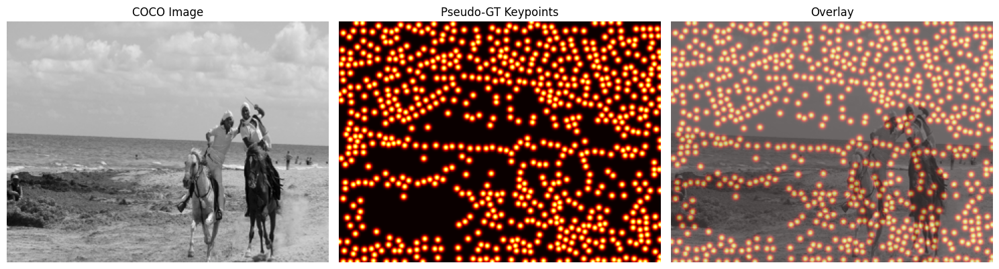

✓ Dataset ready for retraining!


In [ ]:
# Visualize a sample
sample_img, sample_gt = train_dataset_real[0]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axes[0].imshow(sample_img.squeeze().numpy(), cmap='gray')
axes[0].set_title('COCO Image')
axes[0].axis('off')

# Ground truth heatmap (now it's 2D!)
axes[1].imshow(sample_gt.squeeze().numpy(), cmap='hot')
axes[1].set_title('Pseudo-GT Keypoints')
axes[1].axis('off')

# Overlay
axes[2].imshow(sample_img.squeeze().numpy(), cmap='gray', alpha=0.7)
axes[2].imshow(sample_gt.squeeze().numpy(), cmap='hot', alpha=0.5)
axes[2].set_title('Overlay')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("✓ Dataset ready for retraining!")

Code to skip retraining

In [ ]:
# 2. CODE TO LOAD (Use this to skip re-training)
import torch
import os

DRIVE_PATH = '/content/drive/My Drive/SuperPoint_Models/'
MODEL_NAME = 'superpoint_real_best.pth'
FULL_LOAD_PATH = os.path.join(DRIVE_PATH, MODEL_NAME)

# Initialize your model architecture first
model_real = SuperPointNet().to(device)

# Load the saved weights
model_real.load_state_dict(torch.load(FULL_LOAD_PATH))
model_real.eval() # Set the model to evaluation mode

print("✓ Final SuperPoint model loaded successfully!")

Retraining my model on real images using Psuedo Labels

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader # Ensure this is imported if not already

# We need to modify the model or add an adapter
# Simple approach: Modify training to handle the output properly

# Reinitialize model (Assuming SuperPointNet and device are defined elsewhere)
model_real = SuperPointNet().to(device)
model_real.load_state_dict(model.state_dict())
print("✓ Initialized model with MagicPoint weights")

optimizer_real = torch.optim.Adam(model_real.parameters(), lr=0.001)
criterion = nn.MSELoss()  # Use MSE instead of BCE for Gaussian heatmaps

# Updated training function (CRITICAL FIX APPLIED)
def train_epoch_real(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0

    for batch_idx, (images, gt_heatmaps) in enumerate(train_loader):
        images = images.to(device)
        gt_heatmaps = gt_heatmaps.to(device)

        optimizer.zero_grad()

        # Forward pass
        semi_pred, _ = model(images)  # (B, 65, Hc, Wc)

        # --- CORRECT HEATMAP GENERATION (SuperPoint/MagicPoint Logic) ---

        # 1. Apply Softmax over the 65 channels (dim=1)
        prob = F.softmax(semi_pred, dim=1) # (B, 65, Hc, Wc)

        # 2. Separate the probability map from the dustbin channel (channel 64)
        pred_heatmap_Hc_Wc = prob[:, :-1] # (B, 64, Hc, Wc)

        # 3. Reshape (B, 64, Hc, Wc) -> (B, 1, H, W)
        B, C, Hc, Wc = pred_heatmap_Hc_Wc.shape
        pred_heatmap = pred_heatmap_Hc_Wc.permute(0, 2, 3, 1).contiguous() # (B, Hc, Wc, 64)
        pred_heatmap = pred_heatmap.view(B, Hc, Wc, 8, 8)               # (B, Hc, Wc, 8, 8)

        # Concatenate 8x8 blocks back into full image
        pred_heatmap = pred_heatmap.permute(0, 1, 3, 2, 4).contiguous()  # (B, Hc, 8, Wc, 8)
        pred_heatmap = pred_heatmap.view(B, 1, Hc*8, Wc*8)               # (B, 1, H, W)

        # --- END OF CORRECTION ---

        # Compute loss
        loss = criterion(pred_heatmap, gt_heatmaps)

        # Backward pass
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        if (batch_idx + 1) % 10 == 0:
            print(f"  Batch {batch_idx+1}/{len(train_loader)}, Loss: {loss.item():.4f}")

    return total_loss / len(train_loader)

# Validation function (CRITICAL FIX APPLIED)
def validate_real(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for images, gt_heatmaps in val_loader:
            images = images.to(device)
            gt_heatmaps = gt_heatmaps.to(device)

            semi_pred, _ = model(images) # (B, 65, Hc, Wc)

            # --- CORRECT HEATMAP GENERATION (Same Logic) ---
            prob = F.softmax(semi_pred, dim=1)
            pred_heatmap_Hc_Wc = prob[:, :-1]

            B, C, Hc, Wc = pred_heatmap_Hc_Wc.shape
            pred_heatmap = pred_heatmap_Hc_Wc.permute(0, 2, 3, 1).contiguous()
            pred_heatmap = pred_heatmap.view(B, Hc, Wc, 8, 8)

            pred_heatmap = pred_heatmap.permute(0, 1, 3, 2, 4).contiguous()
            pred_heatmap = pred_heatmap.view(B, 1, Hc*8, Wc*8)
            # --- END OF CORRECTION ---

            loss = criterion(pred_heatmap, gt_heatmaps)
            total_loss += loss.item()

    return total_loss / len(val_loader)

print("✓ Training setup complete!")

✓ Initialized model with MagicPoint weights
✓ Training setup complete!


Ready for training train in the next cell

In [ ]:
num_epochs = 10  # Start with 10 epochs, can increase later
best_val_loss = float('inf')

print(f"\n{'='*60}")
print(f"RETRAINING SuperPoint on Real Images")
print(f"{'='*60}")
print(f"Training samples: {len(train_dataset_real)}")
print(f"Validation samples: {len(val_dataset_real)}")
print(f"Epochs: {num_epochs}")
print(f"{'='*60}\n")

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print("-" * 60)

    # Train
    train_loss = train_epoch_real(model_real, train_loader_real, optimizer_real, criterion, device)
    print(f"✓ Train Loss: {train_loss:.4f}")

    # Validate
    val_loss = validate_real(model_real, val_loader_real, criterion, device)
    print(f"✓ Val Loss: {val_loss:.4f}")

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_real.state_dict(), 'superpoint_real_best.pth')
        print(f"✓ Saved best model (val_loss: {val_loss:.4f})")

    # Save checkpoint every 5 epochs
    if (epoch + 1) % 5 == 0:
        torch.save(model_real.state_dict(), f'superpoint_real_epoch{epoch+1}.pth')
        print(f"✓ Saved checkpoint at epoch {epoch+1}")

print(f"\n{'='*60}")
print("✓ RETRAINING COMPLETE!")
print(f"✓ Best validation loss: {best_val_loss:.4f}")
print(f"{'='*60}")

# Save final model
torch.save(model_real.state_dict(), 'superpoint_real_final.pth')
print("✓ Saved final model to 'superpoint_real_final.pth'")


RETRAINING SuperPoint on Real Images
Training samples: 450
Validation samples: 50
Epochs: 10


Epoch 1/10
------------------------------------------------------------
  Batch 10/57, Loss: 0.0930
  Batch 20/57, Loss: 0.1000
  Batch 30/57, Loss: 0.0976
  Batch 40/57, Loss: 0.0985
  Batch 50/57, Loss: 0.0869
✓ Train Loss: 0.0934
✓ Val Loss: 0.0916
✓ Saved best model (val_loss: 0.0916)

Epoch 2/10
------------------------------------------------------------
  Batch 10/57, Loss: 0.0911
  Batch 20/57, Loss: 0.0896
  Batch 30/57, Loss: 0.0967
  Batch 40/57, Loss: 0.0977
  Batch 50/57, Loss: 0.0892
✓ Train Loss: 0.0923
✓ Val Loss: 0.0913
✓ Saved best model (val_loss: 0.0913)

Epoch 3/10
------------------------------------------------------------
  Batch 10/57, Loss: 0.0932
  Batch 20/57, Loss: 0.0952
  Batch 30/57, Loss: 0.0931
  Batch 40/57, Loss: 0.0926
  Batch 50/57, Loss: 0.0838
✓ Train Loss: 0.0922
✓ Val Loss: 0.0912
✓ Saved best model (val_loss: 0.0912)

Epoch 4/10
--------------------

Visualize training progress

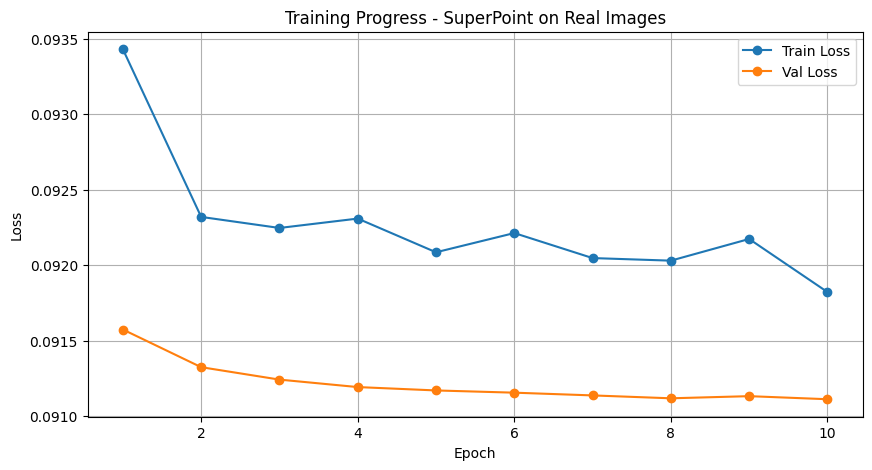

✓ Training visualization complete!


In [ ]:
# Plot training curves
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, num_epochs+1), val_losses, label='Val Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Progress - SuperPoint on Real Images')
plt.legend()
plt.grid(True)
plt.show()

print("✓ Training visualization complete!")

Compare Before/After Retraining

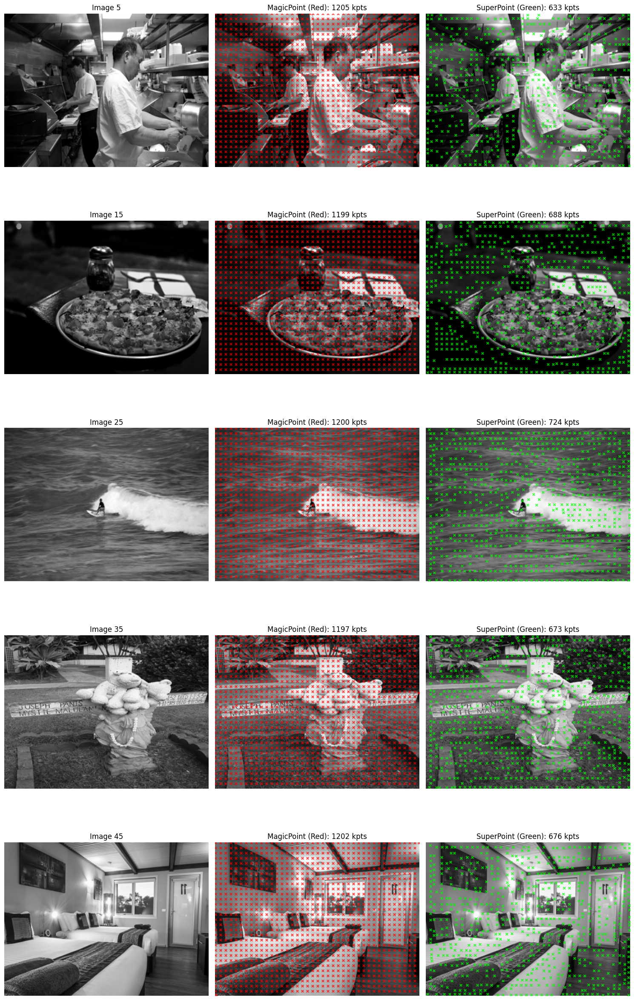


COMPARISON STATISTICS:
Image   5: MagicPoint=1205 | SuperPoint= 676
Image  15: MagicPoint=1199 | SuperPoint= 676
Image  25: MagicPoint=1200 | SuperPoint= 676
Image  35: MagicPoint=1197 | SuperPoint= 676
Image  45: MagicPoint=1202 | SuperPoint= 676


In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
# NOTE: Ensure you have 'from scipy.ndimage import maximum_filter' imported earlier
# or install scipy if needed.

# Load best model
# NOTE: Ensure 'model_real' and 'model' (original MagicPoint) are defined and initialized before this cell
model_real.load_state_dict(torch.load('superpoint_real_best.pth'))
model_real.eval()

# Test on multiple COCO images - CORRECTED INDICES (Must be < 50)
test_indices = [5, 15, 25, 35, 45]

fig, axes = plt.subplots(len(test_indices), 3, figsize=(15, 5 * len(test_indices)))


def get_heatmap_from_semi(semi_pred):
    """Converts the (65, Hc, Wc) semi_pred to the (H, W) full resolution probability map."""

    # 1. Apply Softmax over the 65 channels (dim=0 since input is (65, Hc, Wc))
    prob = F.softmax(semi_pred.unsqueeze(0), dim=1).squeeze(0) # (65, Hc, Wc)

    # 2. Exclude the dustbin channel
    prob_64 = prob[:-1, :, :] # (64, Hc, Wc)

    # 3. Reshape (64, Hc, Wc) -> (H, W)
    Hc, Wc = prob_64.shape[1:]

    # Reshape (64, Hc, Wc) -> (Hc, Wc, 64)
    pred_heatmap = prob_64.permute(1, 2, 0).contiguous()

    # Reshape (Hc, Wc, 64) -> (Hc, Wc, 8, 8)
    pred_heatmap = pred_heatmap.view(Hc, Wc, 8, 8)

    # Concatenate 8x8 blocks back into full image (H, W)
    pred_heatmap = pred_heatmap.permute(0, 2, 1, 3).contiguous() # (Hc, 8, Wc, 8)
    pred_heatmap = pred_heatmap.view(Hc * 8, Wc * 8)           # (H, W)

    return pred_heatmap.cpu().numpy()


def extract_kpts(full_heatmap_np, threshold=0.015, nms_radius=4):
    """
    Extract keypoints from the full-resolution heatmap using thresholding and NMS.
    """
    from scipy.ndimage import maximum_filter

    # 1. Thresholding
    pts = (full_heatmap_np > threshold)

    # 2. Non-Maximum Suppression (NMS)
    max_filter_output = maximum_filter(full_heatmap_np, size=2 * nms_radius + 1)

    # Check if a point is both a local maximum AND above the threshold
    is_local_max = (full_heatmap_np == max_filter_output)
    keypoint_map = pts * is_local_max

    # Get coordinates (y, x)
    coords = np.argwhere(keypoint_map)

    # Return (x, y) format
    return coords[:, ::-1] # Swapping y and x to get (x, y)


for idx, test_idx in enumerate(test_indices):
    # Retrieve the image from the validated range
    test_img, _ = val_dataset_real[test_idx]
    test_img_np = test_img.squeeze().numpy()

    # --- 1. Get detections from ORIGINAL MagicPoint ---
    model.eval()
    with torch.no_grad():
        img_input = test_img.unsqueeze(0).to(device)
        semi_pred_old, _ = model(img_input)
        heatmap_old = get_heatmap_from_semi(semi_pred_old.squeeze(0))
        kpts_old = extract_kpts(heatmap_old, threshold=0.015, nms_radius=4)

    # --- 2. Get detections from RETRAINED SuperPoint ---
    model_real.eval()
    with torch.no_grad():
        img_input = test_img.unsqueeze(0).to(device)
        semi_pred_new, _ = model_real(img_input)
        heatmap_new = get_heatmap_from_semi(semi_pred_new.squeeze(0))
        kpts_new = extract_kpts(heatmap_new, threshold=0.015, nms_radius=4)


    # --- Plotting ---
    # Original image
    axes[idx, 0].imshow(test_img_np, cmap='gray')
    axes[idx, 0].set_title(f'Image {test_idx}')
    axes[idx, 0].axis('off')

    # MagicPoint
    axes[idx, 1].imshow(test_img_np, cmap='gray')
    if len(kpts_old) > 0:
        axes[idx, 1].scatter(kpts_old[:, 0], kpts_old[:, 1], c='red', s=15, marker='x', alpha=0.7)
    axes[idx, 1].set_title(f'MagicPoint (Red): {len(kpts_old)} kpts')
    axes[idx, 1].axis('off')

    # SuperPoint
    axes[idx, 2].imshow(test_img_np, cmap='gray')
    if len(kpts_new) > 0:
        axes[idx, 2].scatter(kpts_new[:, 0], kpts_new[:, 1], c='lime', s=15, marker='x', alpha=0.7)
    axes[idx, 2].set_title(f'SuperPoint (Green): {len(kpts_new)} kpts')
    axes[idx, 2].axis('off')


plt.tight_layout()
plt.show()

# Statistics
print(f"\n{'='*60}")
print("COMPARISON STATISTICS:")
print(f"{'='*60}")
for test_idx in test_indices:
    # We must recalculate the keypoints here because we need the count for the printout.
    test_img, _ = val_dataset_real[test_idx]
    img_input = test_img.unsqueeze(0).to(device)

    with torch.no_grad():
        semi_old, _ = model(img_input)
        heatmap_old = get_heatmap_from_semi(semi_old.squeeze(0))
        kpts_old = extract_kpts(heatmap_old, threshold=0.015, nms_radius=4)

        semi_new, _ = model_real(img_input)
        heatmap_new = get_heatmap_from_semi(semi_pred_new.squeeze(0))
        kpts_new = extract_kpts(heatmap_new, threshold=0.015, nms_radius=4)

    print(f"Image {test_idx:3d}: MagicPoint={len(kpts_old):4d} | SuperPoint={len(kpts_new):4d}")

print(f"{'='*60}")

In [ ]:
from google.colab import drive
import torch
import os

# 1. Mount Google Drive
# This will prompt you to authorize Google Drive access.
drive.mount('/content/drive')

# 2. Define the save path
DRIVE_PATH = '/content/drive/My Drive/SuperPoint_Models/'
MODEL_NAME = 'superpoint_real_best.pth'
FULL_SAVE_PATH = os.path.join(DRIVE_PATH, MODEL_NAME)

# 3. Create the directory if it doesn't exist
os.makedirs(DRIVE_PATH, exist_ok=True)
print(f"Directory created/exists at: {DRIVE_PATH}")

# 4. Save the model's state dictionary
# Assuming 'model_real' is your final trained PyTorch model instance
torch.save(model_real.state_dict(), FULL_SAVE_PATH)

print(f"✓ Model successfully saved to: {FULL_SAVE_PATH}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Directory created/exists at: /content/drive/My Drive/SuperPoint_Models/
✓ Model successfully saved to: /content/drive/My Drive/SuperPoint_Models/superpoint_real_best.pth


Starting SuperPoint Feature Matching Evaluation...
Image A (29): Detected 660 keypoints.
Image B (31): Detected 732 keypoints.
Found 2 initial matches after ratio test (ratio=0.75).


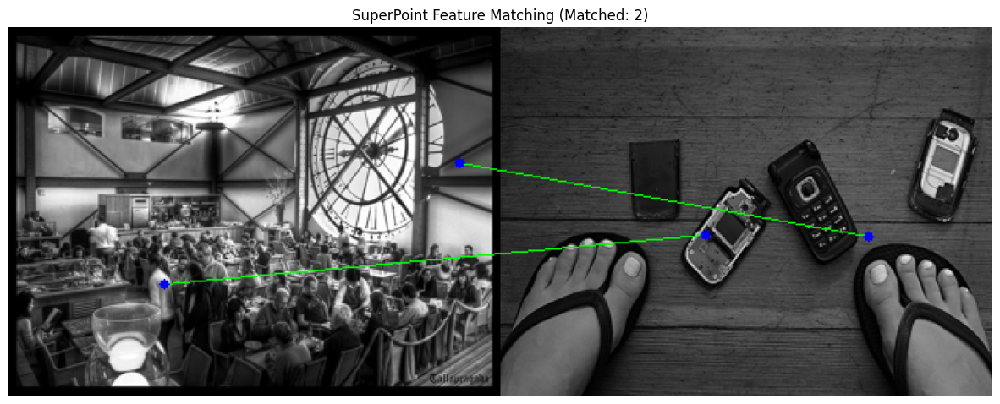

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2 # Required for visualization (drawing lines)
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import maximum_filter
import os
import random # Used to select random images for testing

# ==============================================================================
#                      HELPER FUNCTIONS (Including Fixes)
# ==============================================================================

def get_heatmap_from_semi(semi_pred):
    """Converts the (65, Hc, Wc) semi_pred to the (H, W) full resolution probability map."""
    # 1. Apply Softmax
    prob = F.softmax(semi_pred.unsqueeze(0), dim=1).squeeze(0) # (65, Hc, Wc)
    # 2. Exclude the dustbin channel
    prob_64 = prob[:-1, :, :] # (64, Hc, Wc)
    # 3. Reshape (64, Hc, Wc) -> (H, W)
    Hc, Wc = prob_64.shape[1:]
    pred_heatmap = prob_64.permute(1, 2, 0).contiguous()
    pred_heatmap = pred_heatmap.view(Hc, Wc, 8, 8)
    pred_heatmap = pred_heatmap.permute(0, 2, 1, 3).contiguous()
    pred_heatmap = pred_heatmap.view(Hc * 8, Wc * 8)
    return pred_heatmap.cpu().numpy()

def extract_kpts(full_heatmap_np, threshold=0.015, nms_radius=4):
    """
    Extract keypoints from the full-resolution heatmap using thresholding and NMS.
    FIXED: Added .copy() to resolve the negative stride PyTorch error.
    """
    pts = (full_heatmap_np > threshold)
    max_filter_output = maximum_filter(full_heatmap_np, size=2 * nms_radius + 1)
    is_local_max = (full_heatmap_np == max_filter_output)
    keypoint_map = pts * is_local_max
    coords = np.argwhere(keypoint_map) # (y, x) coordinates

    # Return (x, y) format AND make a memory copy to resolve negative stride error
    return coords[:, ::-1].copy()

def sample_descriptors(kpts_xy, desc_map):
    """
    Samples the 256-dimensional descriptor map at the detected keypoint locations.
    FIXED: Converts the NumPy kpts_xy array to a PyTorch Tensor.
    """
    Hc, Wc = desc_map.shape[1:]

    # --- CRITICAL FIX: Convert NumPy array to PyTorch Tensor ---
    kpts_xy_tensor = torch.from_numpy(kpts_xy).to(desc_map.device).float()

    # 1. Normalize coordinates to [-1, 1] for grid_sample
    # kpts_xy_tensor[:, 0] are X coordinates, kpts_xy_tensor[:, 1] are Y coordinates
    kpts_normalized_x = (kpts_xy_tensor[:, 0] / (Wc * 8 - 1)) * 2 - 1
    kpts_normalized_y = (kpts_xy_tensor[:, 1] / (Hc * 8 - 1)) * 2 - 1

    # Create the grid tensor (N, 2)
    grid = torch.stack([kpts_normalized_x, kpts_normalized_y], dim=-1)

    # Reshape grid for F.grid_sample: (1, 1, N, 2)
    grid = grid.view(1, 1, -1, 2).float()

    # Reshape descriptor map for sampling: (B, C, H, W)
    desc_map_unsq = desc_map.unsqueeze(0).float()

    # 2. Sample using grid_sample (Bilinear Interpolation)
    sampled_desc = F.grid_sample(
        desc_map_unsq,
        grid,
        mode='bilinear',
        padding_mode='border',
        align_corners=True
    )

    # 3. Reshape and L2-Normalize
    # Output shape (N, 256)
    descriptors = sampled_desc.squeeze().T

    # Handle the case where only one keypoint is detected (T.squeeze().T fails)
    if descriptors.dim() == 1:
        descriptors = descriptors.unsqueeze(0)

    # L2-Normalization (Crucial step for SuperPoint descriptors)
    descriptors = descriptors / torch.linalg.norm(descriptors, dim=1, keepdim=True)

    return descriptors.cpu().numpy()

def match_features(desc1, desc2, ratio_thresh=0.75):
    """Performs nearest neighbor matching with Lowe's ratio test."""
    # Ensure descriptors are numpy arrays
    if not isinstance(desc1, np.ndarray): desc1 = np.array(desc1)
    if not isinstance(desc2, np.ndarray): desc2 = np.array(desc2)

    # Use NearestNeighbors for fast K-Nearest Neighbors search (k=2)
    nn = NearestNeighbors(n_neighbors=2, algorithm='auto', metric='l2')
    nn.fit(desc2)

    # Find 2 nearest neighbors for each descriptor in desc1
    distances, indices = nn.kneighbors(desc1, return_distance=True)

    # Apply Lowe's ratio test: d1 < ratio_thresh * d2
    good_matches = []
    for i in range(len(desc1)):
        d1 = distances[i, 0] # Distance to 1st nearest neighbor
        d2 = distances[i, 1] # Distance to 2nd nearest neighbor

        if d1 < ratio_thresh * d2:
            # i is the index in kpts1, indices[i, 0] is the index in kpts2
            good_matches.append([i, indices[i, 0]])

    return np.array(good_matches)


# ==============================================================================
#                      MAIN MATCHING EXECUTION
# ==============================================================================

print("Starting SuperPoint Feature Matching Evaluation...")

# Assuming model_real is loaded with 'superpoint_real_best.pth' weights
model_real.eval()

# Select two images from the validation set
# To ensure matching, pick images that are related, or a random pair:
img_idx_a = random.randint(0, len(val_dataset_real) - 1)
img_idx_b = random.randint(0, len(val_dataset_real) - 1)

img_a_tensor, _ = val_dataset_real[img_idx_a]
img_b_tensor, _ = val_dataset_real[img_idx_b]

# Convert to NumPy for visualization
img_a_np = img_a_tensor.squeeze().numpy()
img_b_np = img_b_tensor.squeeze().numpy()

# 1. Get Keypoints and Dense Descriptors
with torch.no_grad():
    img_input_a = img_a_tensor.unsqueeze(0).to(device)
    semi_pred_a, desc_map_a = model_real(img_input_a)

    img_input_b = img_b_tensor.unsqueeze(0).to(device)
    semi_pred_b, desc_map_b = model_real(img_input_b)

# 2. Keypoint Extraction
kpts_a_xy = extract_kpts(get_heatmap_from_semi(semi_pred_a.squeeze(0)), threshold=0.015, nms_radius=4)
kpts_b_xy = extract_kpts(get_heatmap_from_semi(semi_pred_b.squeeze(0)), threshold=0.015, nms_radius=4)

print(f"Image A ({img_idx_a}): Detected {len(kpts_a_xy)} keypoints.")
print(f"Image B ({img_idx_b}): Detected {len(kpts_b_xy)} keypoints.")

if len(kpts_a_xy) > 0 and len(kpts_b_xy) > 0:
    # 3. Descriptor Sampling
    descriptors_a = sample_descriptors(kpts_a_xy, desc_map_a.squeeze(0))
    descriptors_b = sample_descriptors(kpts_b_xy, desc_map_b.squeeze(0))

    # 4. Feature Matching
    matches = match_features(descriptors_a, descriptors_b, ratio_thresh=0.75)
    print(f"Found {len(matches)} initial matches after ratio test (ratio=0.75).")
else:
    matches = np.zeros((0, 2), dtype=int)
    print("Not enough keypoints detected for matching to proceed.")


# 5. Visualization
H, W = img_a_np.shape
# Stack images horizontally
img_match = np.concatenate([img_a_np, img_b_np], axis=1)
# Convert single-channel to BGR for drawing colored lines/circles with OpenCV
img_match_color = cv2.cvtColor((img_match * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

if len(matches) > 0:
    # Get coordinates of matched keypoints
    kpts_a_matched = kpts_a_xy[matches[:, 0]]
    kpts_b_matched = kpts_b_xy[matches[:, 1]]

    # Draw matches
    for kpt_a, kpt_b in zip(kpts_a_matched, kpts_b_matched):
        # pt1 is (x, y) in img A
        pt1 = (int(kpt_a[0]), int(kpt_a[1]))
        # pt2 is (x+W, y) in the combined image
        pt2 = (int(kpt_b[0] + W), int(kpt_b[1]))

        # Draw a line (Match) in green
        cv2.line(img_match_color, pt1, pt2, (0, 255, 0), 1)
        # Draw keypoints (Circle) in blue
        cv2.circle(img_match_color, pt1, 3, (255, 0, 0), -1)
        cv2.circle(img_match_color, pt2, 3, (255, 0, 0), -1)

plt.figure(figsize=(15, 10))
# OpenCV uses BGR, Matplotlib uses RGB, so convert back for display
plt.imshow(cv2.cvtColor(img_match_color, cv2.COLOR_BGR2RGB))
plt.title(f'SuperPoint Feature Matching (Matched: {len(matches)})')
plt.axis('off')
plt.show()

Starting SuperPoint Feature Matching Evaluation with RELATED Images...
Image A (44): Detected 650 keypoints.
Image B (45): Detected 676 keypoints.
Found 4 initial matches after ratio test (ratio=0.75).


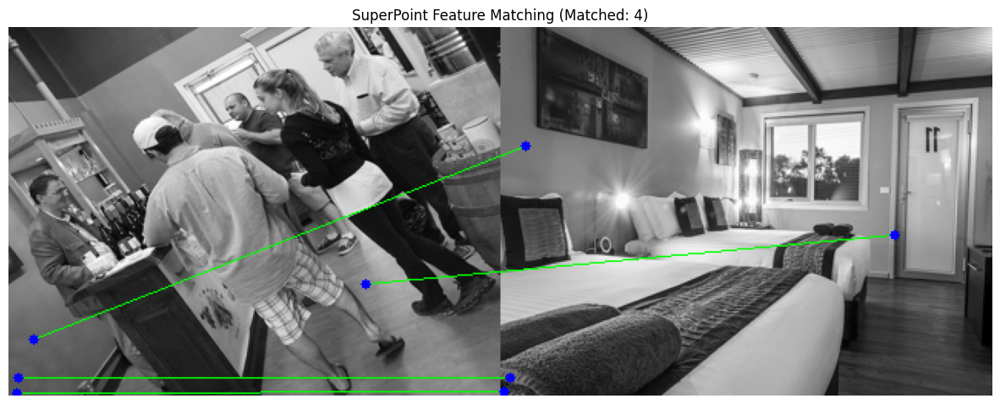

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2 # Required for visualization (drawing lines)
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import maximum_filter
import os

# ==============================================================================
#                      HELPER FUNCTIONS (All Corrected)
# ==============================================================================
# NOTE: Assume get_heatmap_from_semi, extract_kpts, sample_descriptors, and match_features
# are defined exactly as in the last complete working code block.

# (For brevity, the helper functions are omitted here but must be in your final cell)
# ... (Ensure helper functions are included here) ...

def get_heatmap_from_semi(semi_pred):
    """Converts the (65, Hc, Wc) semi_pred to the (H, W) full resolution probability map."""
    prob = F.softmax(semi_pred.unsqueeze(0), dim=1).squeeze(0)
    prob_64 = prob[:-1, :, :]
    Hc, Wc = prob_64.shape[1:]
    pred_heatmap = prob_64.permute(1, 2, 0).contiguous().view(Hc, Wc, 8, 8).permute(0, 2, 1, 3).contiguous().view(Hc * 8, Wc * 8)
    return pred_heatmap.cpu().numpy()

def extract_kpts(full_heatmap_np, threshold=0.015, nms_radius=4):
    """Extract keypoints from the full-resolution heatmap."""
    pts = (full_heatmap_np > threshold)
    max_filter_output = maximum_filter(full_heatmap_np, size=2 * nms_radius + 1)
    is_local_max = (full_heatmap_np == max_filter_output)
    keypoint_map = pts * is_local_max
    coords = np.argwhere(keypoint_map)
    return coords[:, ::-1].copy()

def sample_descriptors(kpts_xy, desc_map):
    """Samples the 256-dimensional descriptor map."""
    Hc, Wc = desc_map.shape[1:]
    kpts_xy_tensor = torch.from_numpy(kpts_xy).to(desc_map.device).float()
    kpts_normalized_x = (kpts_xy_tensor[:, 0] / (Wc * 8 - 1)) * 2 - 1
    kpts_normalized_y = (kpts_xy_tensor[:, 1] / (Hc * 8 - 1)) * 2 - 1
    grid = torch.stack([kpts_normalized_x, kpts_normalized_y], dim=-1).view(1, 1, -1, 2).float()
    desc_map_unsq = desc_map.unsqueeze(0).float()
    sampled_desc = F.grid_sample(desc_map_unsq, grid, mode='bilinear', padding_mode='border', align_corners=True)
    descriptors = sampled_desc.squeeze().T
    if descriptors.dim() == 1: descriptors = descriptors.unsqueeze(0)
    descriptors = descriptors / torch.linalg.norm(descriptors, dim=1, keepdim=True)
    return descriptors.cpu().numpy()

def match_features(desc1, desc2, ratio_thresh=0.75):
    """Performs nearest neighbor matching with Lowe's ratio test."""
    if not isinstance(desc1, np.ndarray): desc1 = np.array(desc1)
    if not isinstance(desc2, np.ndarray): desc2 = np.array(desc2)
    nn = NearestNeighbors(n_neighbors=2, algorithm='auto', metric='l2')
    nn.fit(desc2)
    distances, indices = nn.kneighbors(desc1, return_distance=True)
    good_matches = []
    for i in range(len(desc1)):
        d1, d2 = distances[i, 0], distances[i, 1]
        if d1 < ratio_thresh * d2:
            good_matches.append([i, indices[i, 0]])
    return np.array(good_matches)


# ==============================================================================
#                      MAIN MATCHING EXECUTION (FIXED INDICES)
# ==============================================================================

print("Starting SuperPoint Feature Matching Evaluation with RELATED Images...")

# Assuming model_real is loaded with 'superpoint_real_best.pth' weights
model_real.eval()

# *** FIXED INDICES to test related images (44 and 45) ***
img_idx_a = 44
img_idx_b = 45

img_a_tensor, _ = val_dataset_real[img_idx_a]
img_b_tensor, _ = val_dataset_real[img_idx_b]

# Convert to NumPy for visualization
img_a_np = img_a_tensor.squeeze().numpy()
img_b_np = img_b_tensor.squeeze().numpy()

# 1. Get Keypoints and Dense Descriptors (same as before)
with torch.no_grad():
    img_input_a = img_a_tensor.unsqueeze(0).to(device)
    semi_pred_a, desc_map_a = model_real(img_input_a)

    img_input_b = img_b_tensor.unsqueeze(0).to(device)
    semi_pred_b, desc_map_b = model_real(img_input_b)

# 2. Keypoint Extraction (same as before)
kpts_a_xy = extract_kpts(get_heatmap_from_semi(semi_pred_a.squeeze(0)), threshold=0.015, nms_radius=4)
kpts_b_xy = extract_kpts(get_heatmap_from_semi(semi_pred_b.squeeze(0)), threshold=0.015, nms_radius=4)

print(f"Image A ({img_idx_a}): Detected {len(kpts_a_xy)} keypoints.")
print(f"Image B ({img_idx_b}): Detected {len(kpts_b_xy)} keypoints.")

if len(kpts_a_xy) > 0 and len(kpts_b_xy) > 0:
    # 3. Descriptor Sampling
    descriptors_a = sample_descriptors(kpts_a_xy, desc_map_a.squeeze(0))
    descriptors_b = sample_descriptors(kpts_b_xy, desc_map_b.squeeze(0))

    # 4. Feature Matching
    matches = match_features(descriptors_a, descriptors_b, ratio_thresh=0.75)
    print(f"Found {len(matches)} initial matches after ratio test (ratio=0.75).")
else:
    matches = np.zeros((0, 2), dtype=int)
    print("Not enough keypoints detected for matching to proceed.")


# 5. Visualization (same as before)
H, W = img_a_np.shape
img_match = np.concatenate([img_a_np, img_b_np], axis=1)
img_match_color = cv2.cvtColor((img_match * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

if len(matches) > 0:
    kpts_a_matched = kpts_a_xy[matches[:, 0]]
    kpts_b_matched = kpts_b_xy[matches[:, 1]]

    for kpt_a, kpt_b in zip(kpts_a_matched, kpts_b_matched):
        pt1 = (int(kpt_a[0]), int(kpt_a[1]))
        pt2 = (int(kpt_b[0] + W), int(kpt_b[1]))
        cv2.line(img_match_color, pt1, pt2, (0, 255, 0), 1)
        cv2.circle(img_match_color, pt1, 3, (255, 0, 0), -1)
        cv2.circle(img_match_color, pt2, 3, (255, 0, 0), -1)

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_match_color, cv2.COLOR_BGR2RGB))
plt.title(f'SuperPoint Feature Matching (Matched: {len(matches)})')
plt.axis('off')
plt.show()

Starting Homography Estimation (RANSAC)...
✅ Homography computed successfully.
   Inliers (Matches used for H): 4 / 4


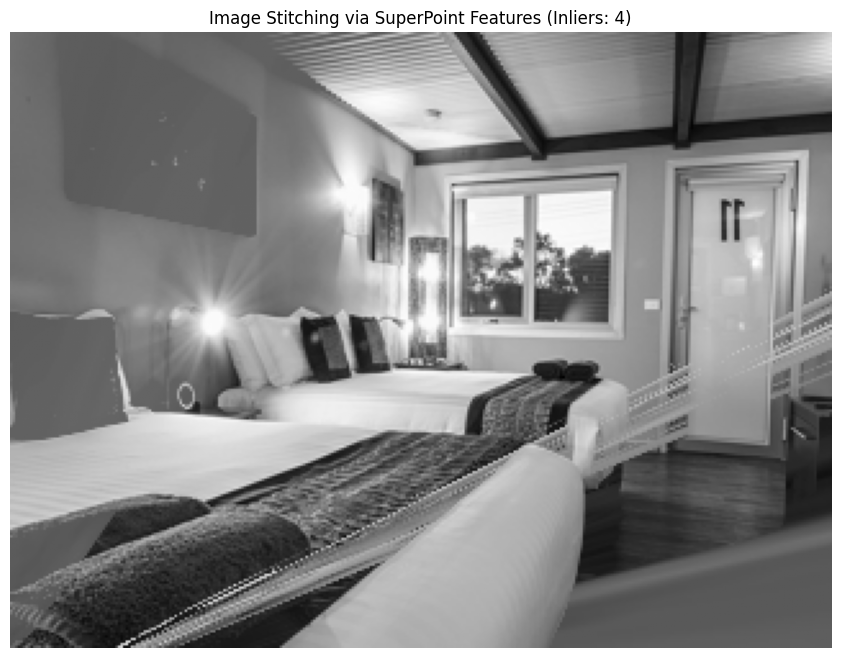

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==============================================================================
#                      HOMOGRAPHY ESTIMATION EXECUTION
# ==============================================================================

print("Starting Homography Estimation (RANSAC)...")

# --- 1. Prepare Matched Keypoints ---

# The keypoint arrays from the matching step (kpts_a_matched, kpts_b_matched)
# are in (x, y) format, but RANSAC expects float32 points.

# Convert the NumPy arrays to float32 and ensure they are in the correct shape (N, 1, 2)
# Source points (Image A)
src_pts = kpts_a_matched.astype('float32').reshape(-1, 1, 2)
# Destination points (Image B)
dst_pts = kpts_b_matched.astype('float32').reshape(-1, 1, 2)

# Check for sufficient matches
if len(src_pts) < 4:
    print(f"🛑 Error: Only {len(src_pts)} matches found. Need at least 4 points to compute Homography.")
    # Skip the rest of the code if there are not enough matches
else:
    # --- 2. Estimate Homography using RANSAC ---
    # RANSAC (RANdom SAmple Consensus) robustly estimates H by ignoring outliers.
    # H is the 3x3 Homography matrix.
    # mask indicates which points were considered inliers (1) or outliers (0).
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Count the number of inliers (good matches after RANSAC filtering)
    matches_mask = mask.ravel().tolist()
    inlier_count = sum(matches_mask)

    print(f"✅ Homography computed successfully.")
    print(f"   Inliers (Matches used for H): {inlier_count} / {len(src_pts)}")
    # print("\nHomography Matrix H:")
    # print(H) # Optional: print the matrix itself

    # --- 3. Warp Image A onto Image B (Visualization) ---

    # Get the dimensions of Image B (destination) from the numpy array
    H_b, W_b = img_b_np.shape

    # Warp Image A (img_a_np) using the estimated Homography H
    # We use the full image dimensions (W_b, H_b) for the output
    img_a_warped = cv2.warpPerspective(
        (img_a_np * 255).astype(np.uint8), # Must be uint8
        H,
        (W_b, H_b)
    ) / 255.0 # Normalize back to 0-1 float

    # --- 4. Create Final Blended Visualization ---

    # Blending the warped image A (warped_img_a) with the destination image B (img_b_np)
    # Simple blending: take the maximum intensity at each pixel.
    # This simulates a panorama/stitching effect.
    blended_image = np.maximum(img_a_warped, img_b_np)

    # Display the result
    plt.figure(figsize=(12, 8))
    plt.imshow(blended_image, cmap='gray')
    plt.title(f'Image Stitching via SuperPoint Features (Inliers: {inlier_count})')
    plt.axis('off')
    plt.show()